## Initial Notebook Setup 

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!rm -r ~/.kaggle
!rm -r /content/drive/MyDrive/HAM10k

rm: cannot remove '/root/.kaggle': No such file or directory


In [ ]:
!mkdir /content/drive/MyDrive/HAM10k
!mkdir /content/drive/MyDrive/HAM10k/images
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json
!mv helpers.py /content/drive/MyDrive/HAM10k

In [ ]:
!kaggle datasets download -d kmader/skin-cancer-mnist-ham10000 -p /content/drive/MyDrive/HAM10k

100% 5.19G/5.20G [01:09<00:00, 118MB/s]
100% 5.20G/5.20G [01:09<00:00, 80.5MB/s]


In [ ]:
!unzip -q /content/drive/MyDrive/HAM10k/skin-cancer-mnist-ham10000.zip

In [ ]:
!mv /content/hm*.* /content/drive/MyDrive/HAM10k
!mv /content/HAM10000_metadata.csv /content/drive/MyDrive/HAM10k

In [ ]:
!mv /content/HAM10000_images_part_1/*.* /content/drive/MyDrive/HAM10k/images/
!mv /content/HAM10000_images_part_2/*.* /content/drive/MyDrive/HAM10k/images/

In [ ]:
!rm -r /content/ham10000_images_part_1/
!rm -r /content/ham10000_images_part_2/
!rm -r /content/HAM10000_images_part_1/
!rm -r /content/HAM10000_images_part_2/
!rm -r /content/drive/MyDrive/HAM10k/skin-cancer-mnist-ham10000.zip

Mounted at /content/drive


## Libraries

In [3]:
import sys
sys.path.append('/content/drive/MyDrive/HAM10k') # for importing helpers.py

In [4]:
import cv2 as cv
import sys
import os
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import helpers as hp
import tensorflow as tf
import tensorflow.keras.layers as tfl
import imutils
from pathlib import Path
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.imagenet_utils import preprocess_input, decode_predictions
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, f1_score, roc_curve


tf.random.set_seed(42)

%load_ext autoreload
%autoreload 2

## EDA

In [ ]:
PATH_METADATA = '/content/drive/MyDrive/HAM10k/HAM10000_metadata.csv'

ham10k_df = hp.create_metadata_df(PATH_METADATA)
ham10k_df.head(3)

,lesion_id,dx,dx_type,age,sex,localization,lesion_type
image_id,,,,,,,
ISIC_0024306,HAM_0000550,nv,follow_up,45.0,male,trunk,melanocytic nevi
ISIC_0024307,HAM_0003577,nv,follow_up,50.0,male,lower extremity,melanocytic nevi
ISIC_0024308,HAM_0001477,nv,follow_up,55.0,female,trunk,melanocytic nevi


In [ ]:
ham10k_df.isna().sum()

lesion_id        0
dx               0
dx_type          0
age             57
sex              0
localization     0
lesion_type      0
dtype: int64

In [ ]:
ham10k_df_pt = hp.translate_dataset(ham10k_df)

In [ ]:
ham10k_df_pt.head()

,lesion_id,dx,dx_type,age,sex,localization,lesion_type
image_id,,,,,,,
ISIC_0024306,HAM_0000550,nv,follow_up,45.0,homem,tronco,nevo melanocítico
ISIC_0024307,HAM_0003577,nv,follow_up,50.0,homem,extr. inferior,nevo melanocítico
ISIC_0024308,HAM_0001477,nv,follow_up,55.0,mulher,tronco,nevo melanocítico
ISIC_0024309,HAM_0000484,nv,follow_up,40.0,homem,tronco,nevo melanocítico
ISIC_0024310,HAM_0003350,mel,histo,60.0,homem,peito,melanoma


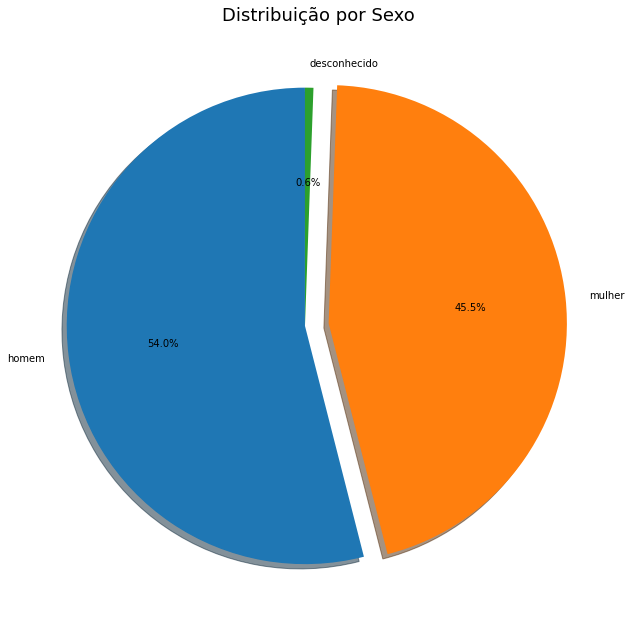

In [ ]:
fig1, ax1 = plt.subplots(figsize=(10,11))
ax1.pie(ham10k_df_pt.sex.value_counts().values, 
        explode=(0, 0.1, 0), 
        labels=ham10k_df_pt.sex.value_counts().index, 
        autopct='%1.1f%%',
        shadow=True, startangle=90)

ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.rc('font', size=15)
plt.rc('axes', labelsize=20)
plt.title('Distribuição por Sexo');

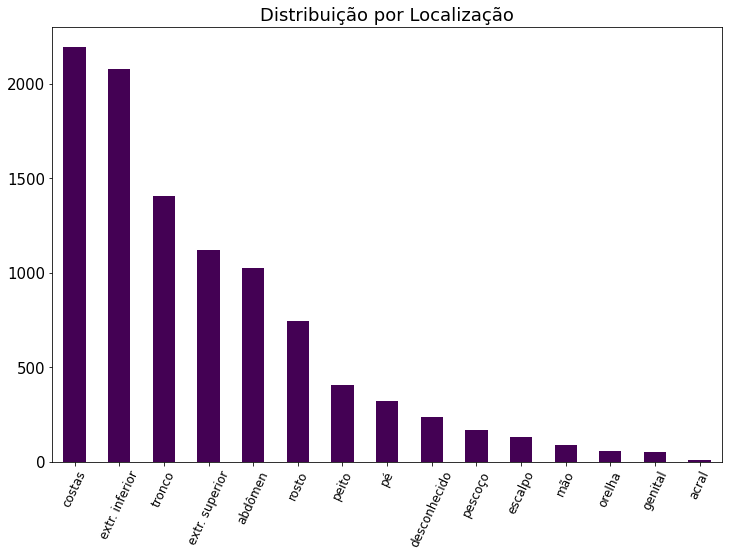

In [ ]:
ham10k_df_pt.localization.value_counts().plot(kind='bar', 
                                              figsize=(12,8), 
                                              cmap='viridis', 
                                              title='Distribuição por Localização')

plt.xticks(rotation = 65, fontsize=12);

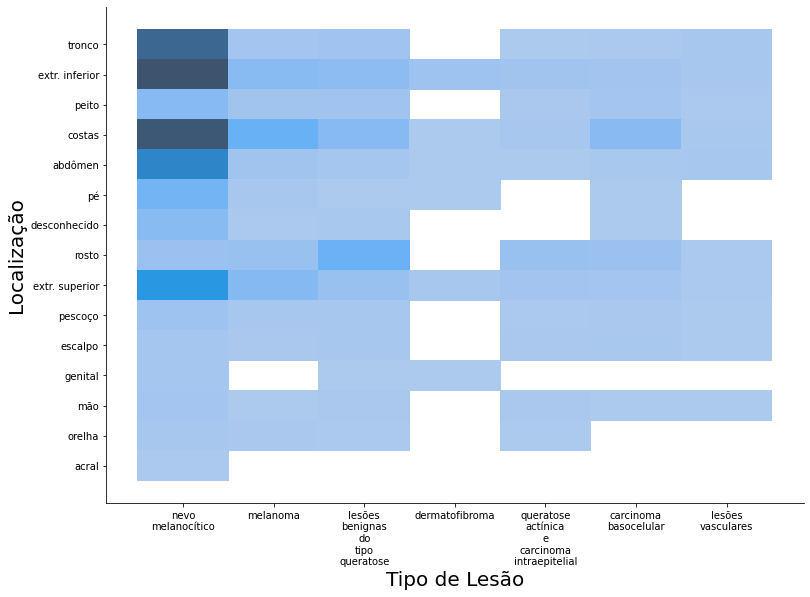

In [ ]:
import textwrap as tw


ax = sns.displot(ham10k_df_pt, x="lesion_type", y="localization", height=8, aspect=1.5)

xticks = [y for x in list(plt.xticks())[1:] for y in x]

texts = ['\n'.join(t.get_text().split(' '))  for t in xticks]
#print(texts)

plt.xlabel('Tipo de Lesão')
plt.ylabel('Localização')
ax.set_xticklabels(texts)
plt.xticks(fontsize=10, rotation=0);
plt.yticks(fontsize=10, rotation=0);

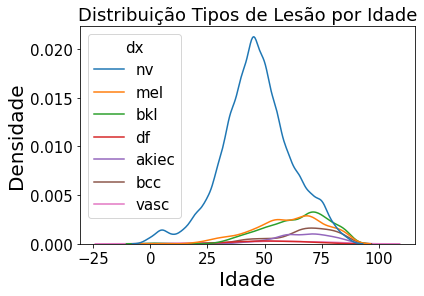

In [ ]:
sns.kdeplot(x=ham10k_df_pt.age, hue=ham10k_df_pt.dx).set(title='Distribuição Tipos de Lesão por Idade',
                                            xlabel='Idade',
                                            ylabel='Densidade');

In [ ]:
ham10k_df.dx.value_counts(normalize=True)

nv       0.669496
mel      0.111133
bkl      0.109735
bcc      0.051323
akiec    0.032651
vasc     0.014179
df       0.011483
Name: dx, dtype: float64

#### Unsupervised Learning

In [ ]:
df_meta = pd.read_csv('/content/drive/MyDrive/HAM10k/hmnist_28_28_L.csv')

df_meta.head()

,pixel0000,pixel0001,pixel0002,pixel0003,pixel0004,pixel0005,pixel0006,pixel0007,pixel0008,pixel0009,...,pixel0775,pixel0776,pixel0777,pixel0778,pixel0779,pixel0780,pixel0781,pixel0782,pixel0783,label
0,169,171,170,177,181,182,181,185,194,192,...,184,186,185,180,157,140,140,159,165,2
1,19,57,105,140,149,148,144,155,170,170,...,172,175,160,144,114,89,47,18,18,2
2,155,163,161,167,167,172,155,152,165,175,...,163,178,157,166,167,148,141,136,115,2
3,25,71,116,139,136,153,148,161,172,162,...,125,135,138,137,111,71,32,16,16,2
4,129,162,181,196,205,208,205,213,225,224,...,210,197,172,190,195,193,181,147,88,2


In [ ]:
class_indices = {idx:cl for idx, cl in enumerate(ham10k_df.dx.unique())}
class_indices

{0: 'nv', 1: 'mel', 2: 'bkl', 3: 'df', 4: 'akiec', 5: 'bcc', 6: 'vasc'}

In [ ]:
# create t-SNE dimensionality reduction
from sklearn import manifold

tsne = manifold.TSNE(n_components=2, random_state=42)

#get images
imgs = df_meta.drop(columns=['label'])
# apply transformation
transf_data = tsne.fit_transform(imgs)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


In [ ]:
targets = df_meta.label.map(class_indices)
tsne_df = pd.DataFrame(
    np.column_stack((transf_data, targets)),
    columns=['CP1', 'CP2', 'targets']
)

In [ ]:
tsne_df.head()

,CP1,CP2,targets
0,7.452062,52.602249,bkl
1,56.368774,22.221943,bkl
2,8.885473,52.777142,bkl
3,55.852982,16.266987,bkl
4,-4.351512,38.888599,bkl


/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


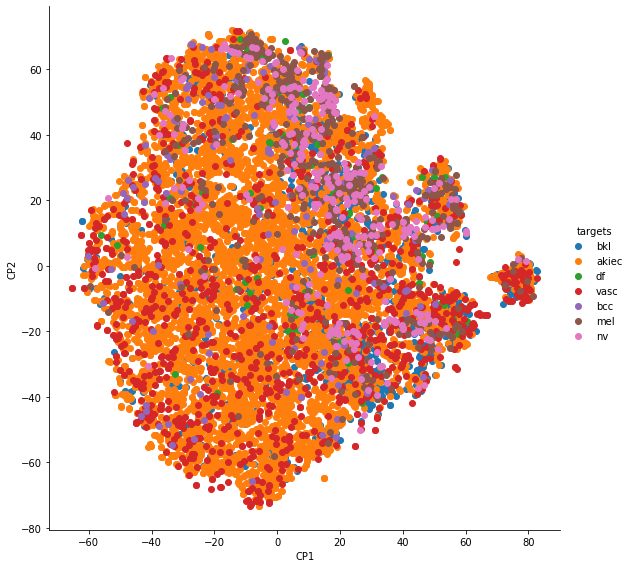

In [ ]:
grid = sns.FacetGrid(tsne_df, hue="targets", size=8)

grid.map(plt.scatter, 'CP1', 'CP2').add_legend()

The classifier seems to take nv cases as melanoma cases. we can notice that even isolated cases of nv there always is a case of ml close to it.

## Data Preprocessing

In [ ]:
PATH_IMAGES = '/content/drive/MyDrive/HAM10k/images'
PATH_METADATA = '/content/drive/MyDrive/HAM10k/HAM10000_metadata.csv'

In [ ]:
df_meta = pd.read_csv(PATH_METADATA,
                          index_col='image_id',
                          usecols=['image_id', 'dx']).sort_index()

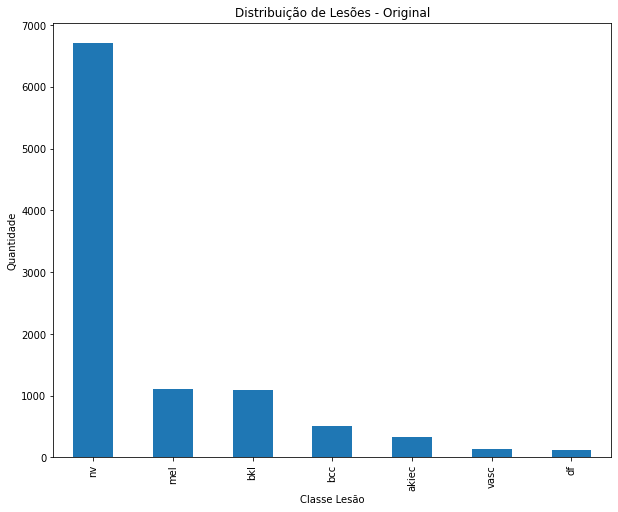

In [ ]:
df_meta.dx.value_counts().plot(kind='bar',
                               figsize=(10, 8), 
                               xlabel='Classe Lesão', 
                               ylabel='Quantidade',
                               title='Distribuição de Lesões - Original');

### Data Augmentation

In [ ]:
# params - minim dataset
# assumption - ignoring most frequent class

df_transf = pd.DataFrame()

for filename in Path(PATH_IMAGES).iterdir():
    index = filename.stem
    
    img_dir = filename.parent
    # metadata record
    entry = df_ham10k.loc[index]

    # skip most frequent class
    mf = df_ham10k.dx.value_counts().keys()[0]
    if entry.dx == mf:
        print(f'Ignoring {index}...')
        print(f'---------------------\n\n')
        pass
    else:
        # read original image
        img = cv.imread(entry.path, cv.COLOR_BGR2RGB)
        print(f'Processing {index}...')
        print(f'Image class {entry.dx}')

        # create blurred version
        blurred = cv.GaussianBlur(img, (7, 7), 0)
        filepath = os.path.join(img_dir, f'{filename.stem}_blur{filename.suffix}')
        # write file to disk
        cv.imwrite(filepath, blurred)
        print('Blurred File wrote to disk.')
        # create entry in dataframe
        new_index = Path(filepath).stem
        new_entry = pd.Series({'dx': entry.dx, 'path': filepath}, name=new_index)
        df_transf = df_transf.append(new_entry)
        print('DataFrame updated.')

        # apply transformations
        # rotation
        if entry.dx in ['vasc', 'df']:
            for rotation in range(15, 360, 20):
                rotated = imutils.rotate(img, rotation)
                filepath = os.path.join(img_dir, f'{filename.stem}_r{rotation}{filename.suffix}')
                # write file to disk
                cv.imwrite(filepath, rotated)
                print('Rotated File wrote to disk.')
                # create entry in dataframe
                new_index = Path(filepath).stem
                new_entry = pd.Series({'dx': entry.dx, 'path': filepath}, name=new_index)
                df_transf = df_transf.append(new_entry)
                print('DataFrame updated.')
        
        if entry.dx in ['bcc', 'akiec']:
            for rotation in range(30, 360, 35):
                rotated = imutils.rotate(img, rotation)
                filepath = os.path.join(img_dir, f'{filename.stem}_r{rotation}{filename.suffix}')
                # write file to disk
                cv.imwrite(filepath, rotated)
                print('Rotated File wrote to disk.')
                # create entry in dataframe
                new_index = Path(filepath).stem
                new_entry = pd.Series({'dx': entry.dx, 'path': filepath}, name=new_index)
                df_transf = df_transf.append(new_entry)
                print('DataFrame updated.')

        
        # apply transformations
        flips = {'horf': 1, 'vertf': 0, 'bothf': -1}
        for flip, axis in flips.items():
            print(f'Applying {flip} tranformation...')
            f_img = cv.flip(img, axis)
            filepath = os.path.join(img_dir, f'{filename.stem}_{flip}{filename.suffix}')
            # write file to disk
            cv.imwrite(filepath, f_img)
            print('Flipped file wrote to disk.')
            # create entry in dataframe
            new_index = Path(filepath).stem
            new_entry = pd.Series({'dx': entry.dx, 'path': filepath}, name=new_index)
            df_transf = df_transf.append(new_entry)
            print('DataFrame updated.')
            print('--------------------------------------\nn')


In [ ]:
df_transf

,dx,path
ISIC_0024310_blur,mel,/content/drive/MyDrive/HAM10k/images/ISIC_0024...
ISIC_0024310_horf,mel,/content/drive/MyDrive/HAM10k/images/ISIC_0024...
ISIC_0024310_vertf,mel,/content/drive/MyDrive/HAM10k/images/ISIC_0024...
ISIC_0024310_bothf,mel,/content/drive/MyDrive/HAM10k/images/ISIC_0024...
ISIC_0024312_blur,bkl,/content/drive/MyDrive/HAM10k/images/ISIC_0024...
...,...,...
ISIC_0034317_bothf,mel,/content/drive/MyDrive/HAM10k/images/ISIC_0034...
ISIC_0034318_blur,bkl,/content/drive/MyDrive/HAM10k/images/ISIC_0034...
ISIC_0034318_horf,bkl,/content/drive/MyDrive/HAM10k/images/ISIC_0034...
ISIC_0034318_vertf,bkl,/content/drive/MyDrive/HAM10k/images/ISIC_0034...


In [ ]:
for rotation in range(30, 360, 30):
    print(rotation)

30
60
90
120
150
180
210
240
270
300
330


In [ ]:
df_transf.dx.value_counts()

bcc      7196
akiec    4578
mel      4452
bkl      4396
vasc     3124
df       2530
Name: dx, dtype: int64

In [ ]:
df_meta2 = pd.concat([df_ham10k, df_transf])

df_meta2.dx.value_counts()

bcc      7710
nv       6705
mel      5565
bkl      5495
akiec    4905
vasc     3266
df       2645
Name: dx, dtype: int64

In [ ]:
df_meta2.sort_index()

,dx,path
ISIC_0024306,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0024...
ISIC_0024307,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0024...
ISIC_0024308,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0024...
ISIC_0024309,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0024...
ISIC_0024310,mel,/content/drive/MyDrive/HAM10k/images/ISIC_0024...
...,...,...
ISIC_0034318_bothf,bkl,/content/drive/MyDrive/HAM10k/images/ISIC_0034...
ISIC_0034318_horf,bkl,/content/drive/MyDrive/HAM10k/images/ISIC_0034...
ISIC_0034318_vertf,bkl,/content/drive/MyDrive/HAM10k/images/ISIC_0034...
ISIC_0034319,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0034...


In [ ]:
# create csv with the transformed images paths
df_meta2.sort_index().to_csv('/content/drive/MyDrive/HAM10k/df_meta.csv')

## Load Data

In [5]:
df_meta = pd.read_csv('/content/drive/MyDrive/HAM10k/df_meta.csv', index_col='Unnamed: 0')

df_meta.head()

,dx,path
ISIC_0024306,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0024...
ISIC_0024307,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0024...
ISIC_0024308,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0024...
ISIC_0024309,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0024...
ISIC_0024310,mel,/content/drive/MyDrive/HAM10k/images/ISIC_0024...


In [ ]:
# select 16 dermatofibrona images
dermatofibrona = df_meta.loc[df_meta.dx == 'df'].sample(n=16)
# select 16 vasc images
vascular = df_meta.loc[df_meta.dx == 'vasc'].sample(n=16)

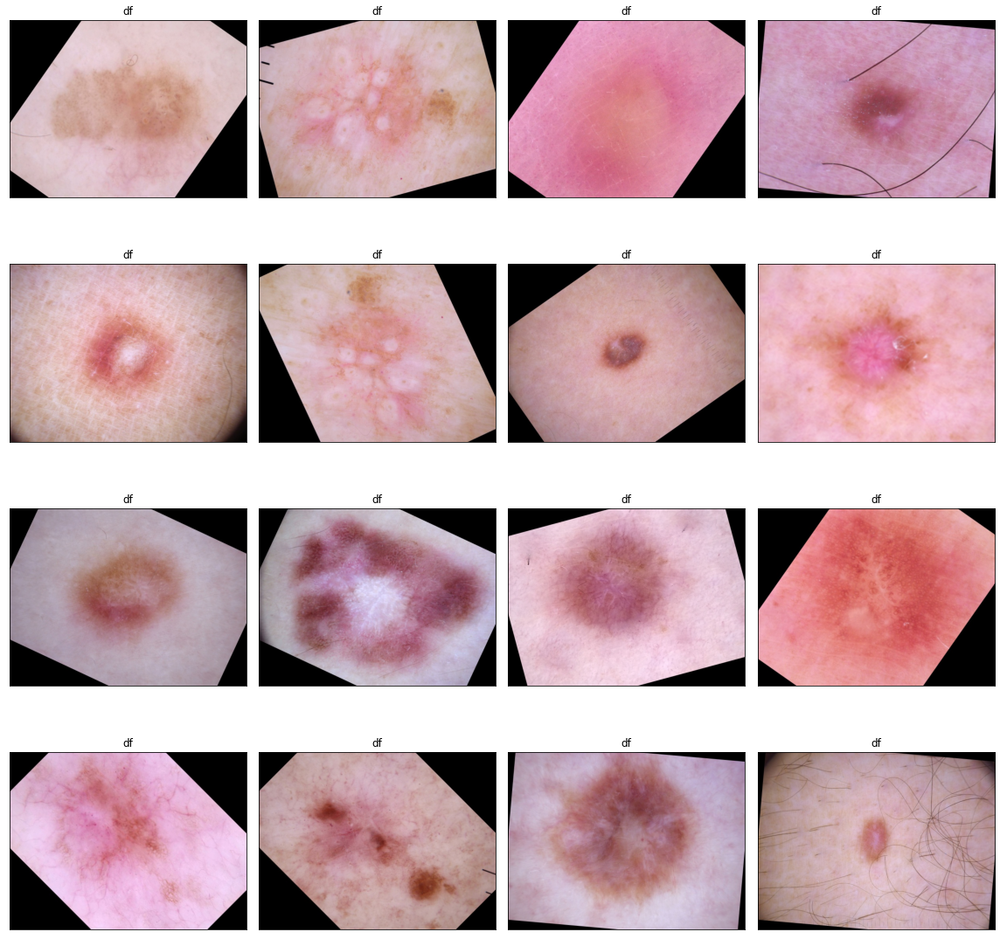

In [ ]:
figure, axes = plt.subplots(nrows = 4, ncols = 4, figsize=(16, 16))

for item in zip(axes.ravel(), dermatofibrona.path, dermatofibrona.dx):
    axes, path, target = item
    img = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
    axes.imshow(img)
    axes.set_xticks([])
    axes.set_yticks([])
    axes.set_title(target)
plt.tight_layout()

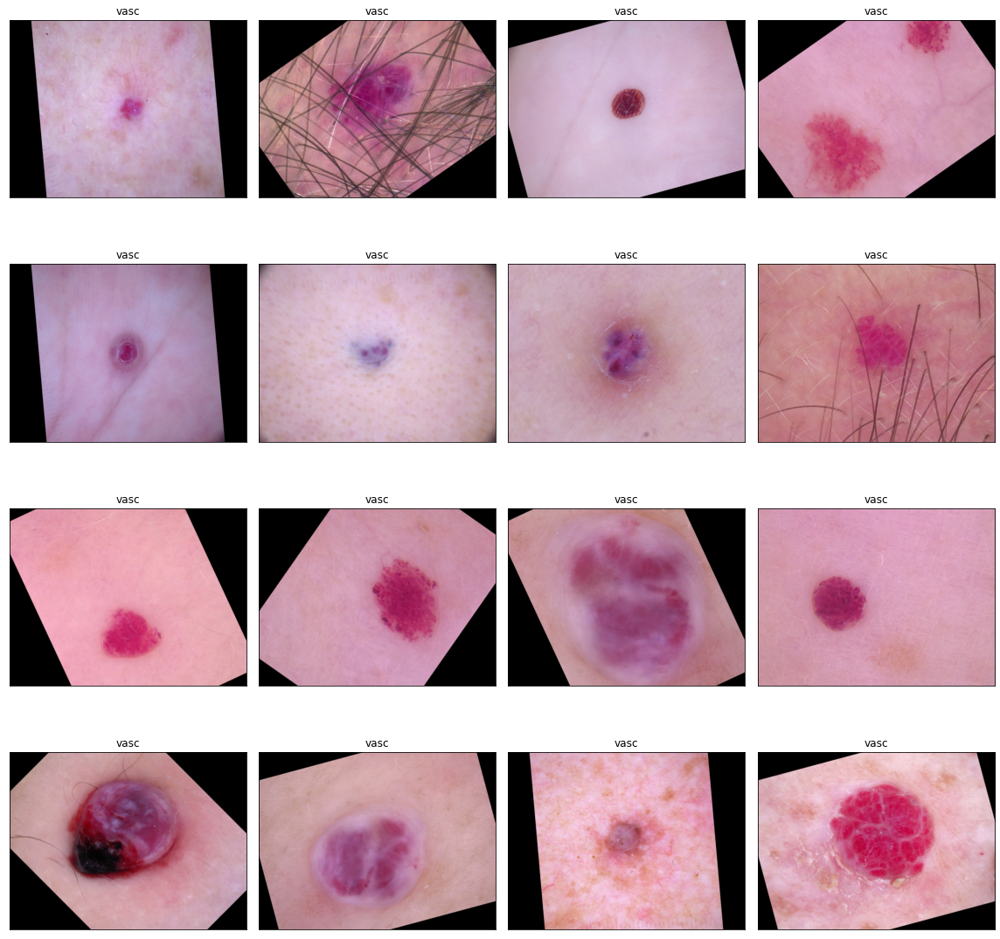

In [ ]:
figure, axes = plt.subplots(nrows = 4, ncols = 4, figsize=(16, 16))

for item in zip(axes.ravel(), vascular.path, vascular.dx):
    axes, path, target = item
    img = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
    axes.imshow(img)
    axes.set_xticks([])
    axes.set_yticks([])
    axes.set_title(target)
plt.tight_layout()

In [ ]:
# select 16 basal carcinoma images
bcc = df_meta.loc[df_meta.dx == 'bcc'].sample(n=16)
# select 16 akiec images
akiec = df_meta.loc[df_meta.dx == 'akiec'].sample(n=16)

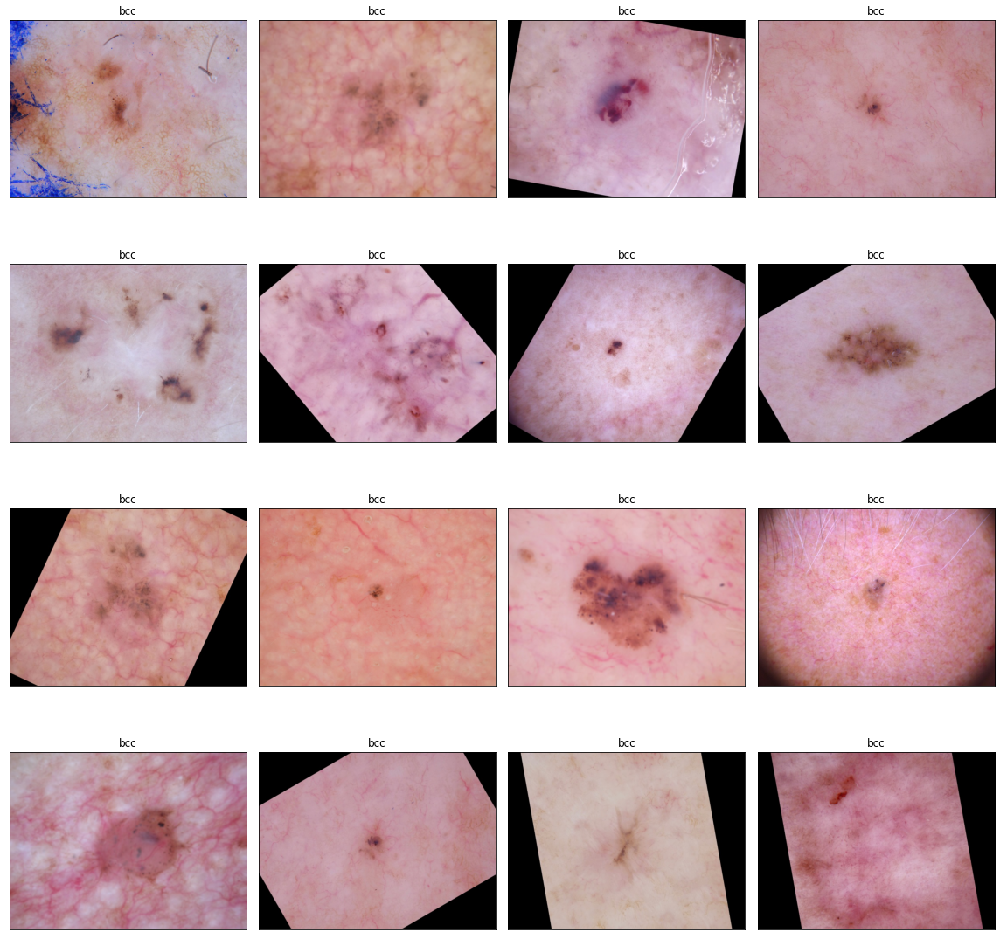

In [ ]:
figure, axes = plt.subplots(nrows = 4, ncols = 4, figsize=(16, 16))

for item in zip(axes.ravel(), bcc.path, bcc.dx):
    axes, path, target = item
    img = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
    axes.imshow(img)
    axes.set_xticks([])
    axes.set_yticks([])
    axes.set_title(target)
plt.tight_layout()

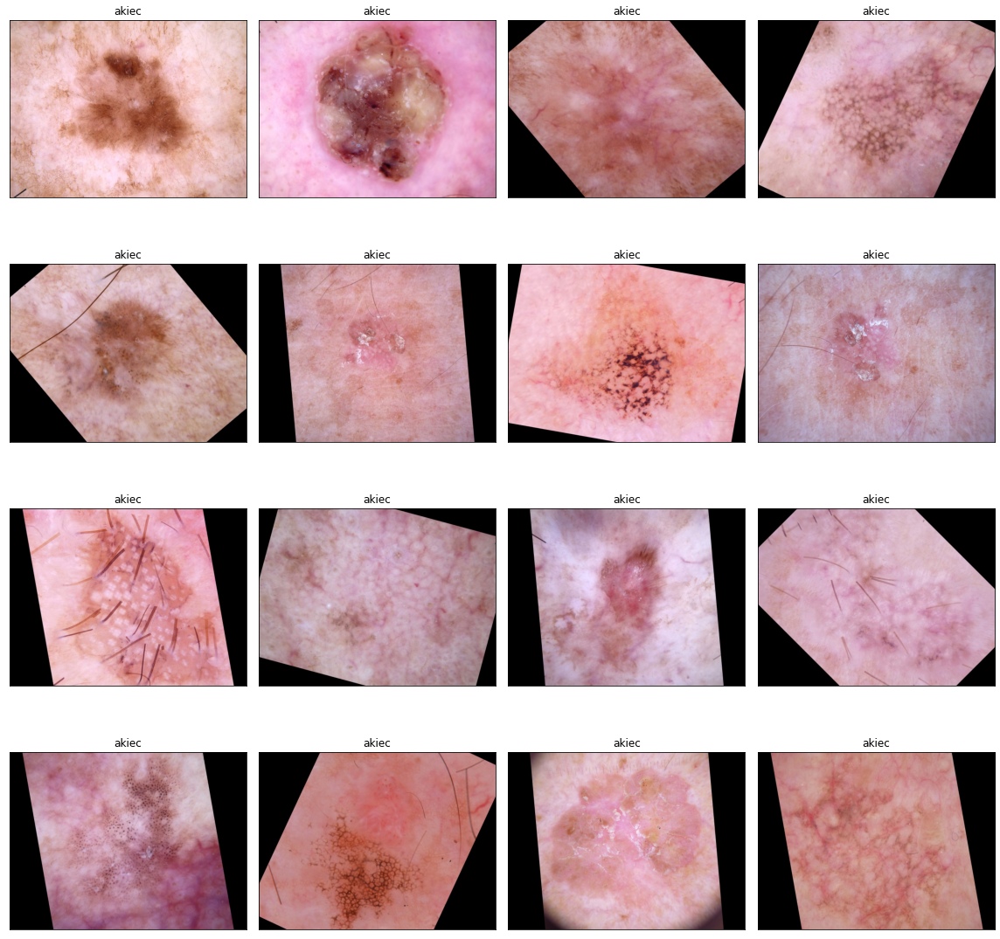

In [ ]:
figure, axes = plt.subplots(nrows = 4, ncols = 4, figsize=(16, 16))

for item in zip(axes.ravel(), akiec.path, akiec.dx):
    axes, path, target = item
    img = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
    axes.imshow(img)
    axes.set_xticks([])
    axes.set_yticks([])
    axes.set_title(target)
plt.tight_layout()

In [ ]:
# select 16 melanoma images
mel = df_meta.loc[df_meta.dx == 'mel'].sample(n=16)
# select 16 nv images
nv = df_meta.loc[df_meta.dx == 'nv'].sample(n=16)
# select 16 bkl images
bkl = df_meta.loc[df_meta.dx == 'bkl'].sample(n=16)

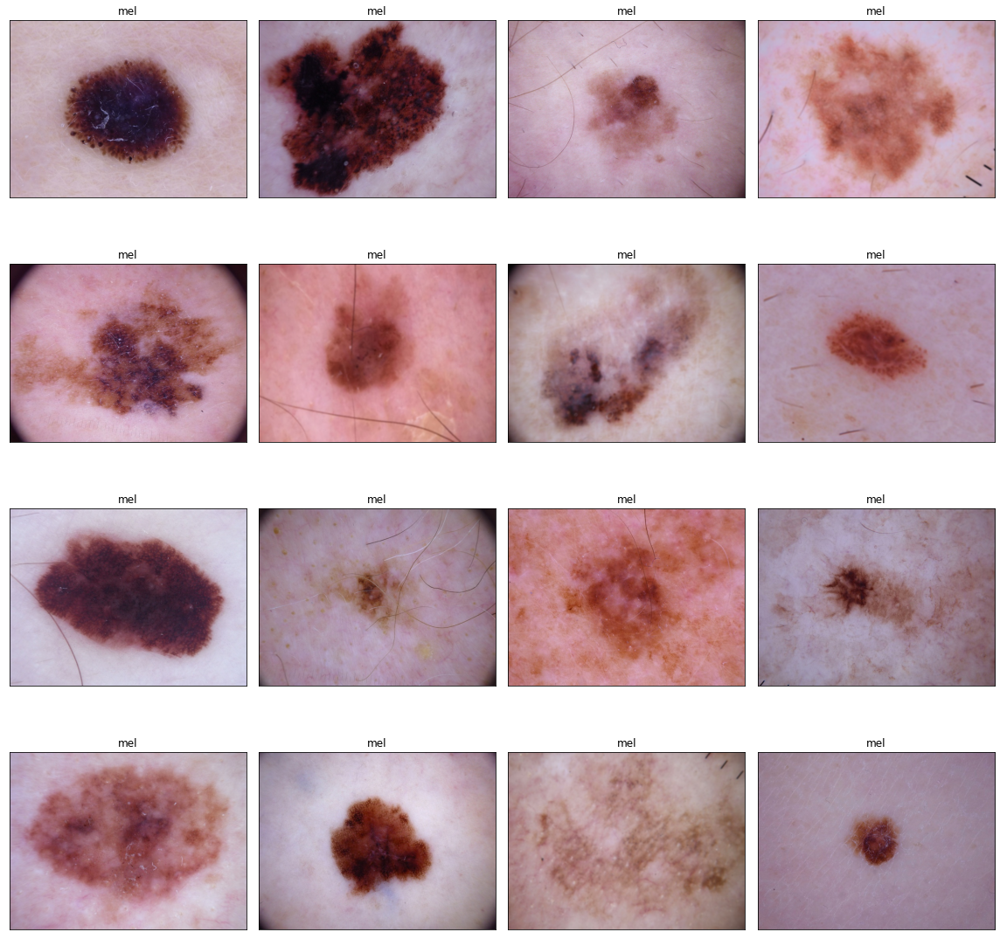

In [ ]:
figure, axes = plt.subplots(nrows = 4, ncols = 4, figsize=(16, 16))

for item in zip(axes.ravel(), mel.path, mel.dx):
    axes, path, target = item
    img = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
    axes.imshow(img)
    axes.set_xticks([])
    axes.set_yticks([])
    axes.set_title(target)
plt.tight_layout()

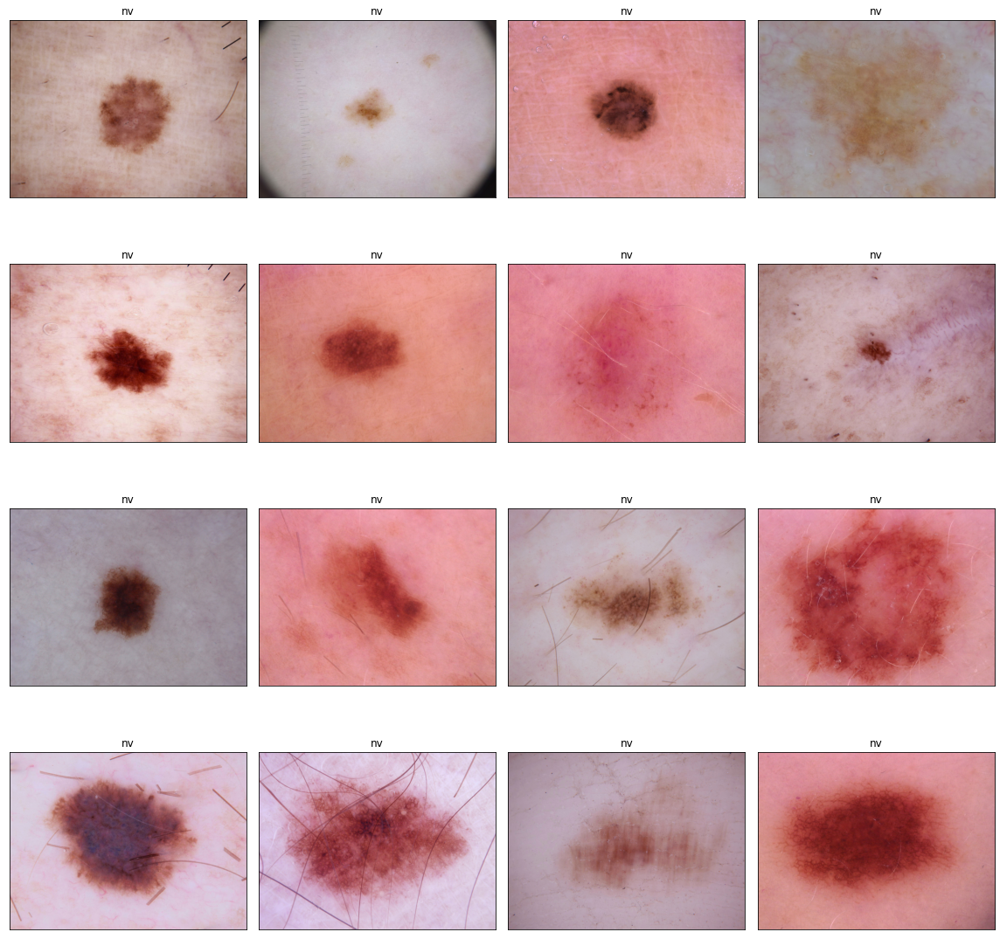

In [ ]:
figure, axes = plt.subplots(nrows = 4, ncols = 4, figsize=(16, 16))

for item in zip(axes.ravel(), nv.path, nv.dx):
    axes, path, target = item
    img = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
    axes.imshow(img)
    axes.set_xticks([])
    axes.set_yticks([])
    axes.set_title(target)
plt.tight_layout()

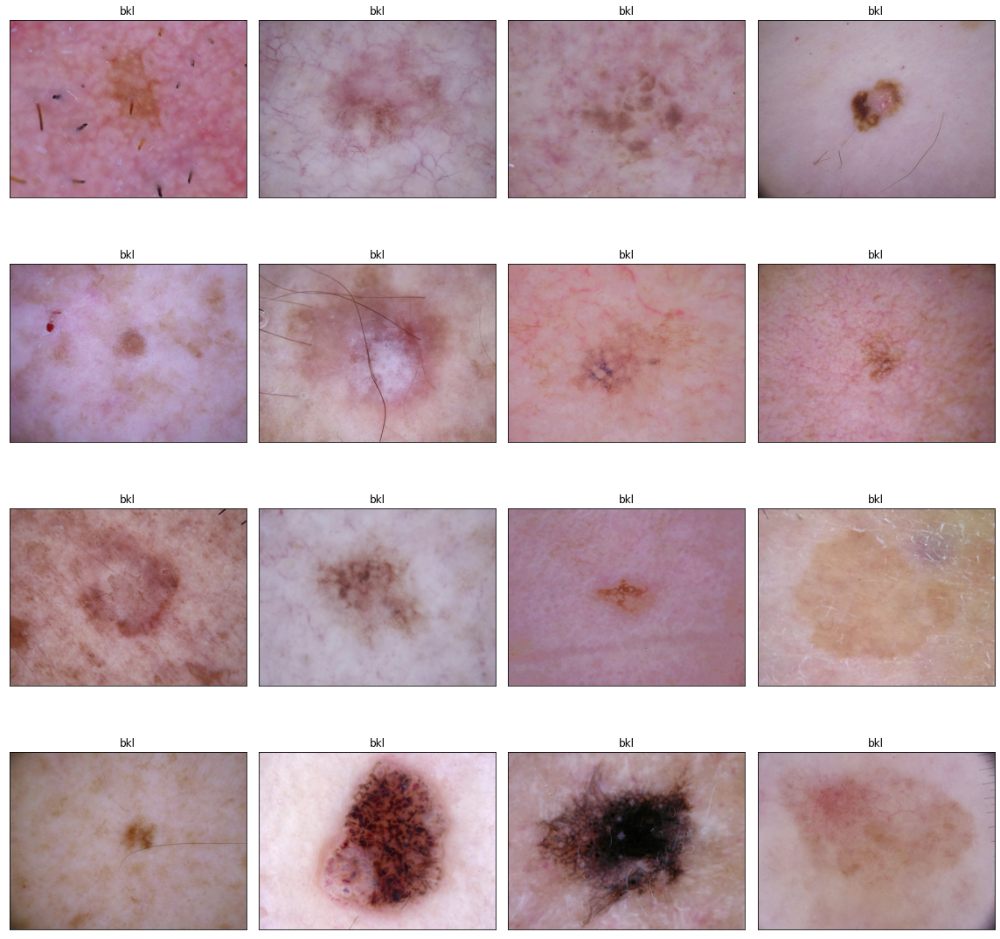

In [ ]:
figure, axes = plt.subplots(nrows = 4, ncols = 4, figsize=(16, 16))

for item in zip(axes.ravel(), bkl.path, bkl.dx):
    axes, path, target = item
    img = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
    axes.imshow(img)
    axes.set_xticks([])
    axes.set_yticks([])
    axes.set_title(target)
plt.tight_layout()

In [ ]:
df_meta.dx.value_counts(normalize=True)

bcc      0.212449
nv       0.184757
mel      0.153344
bkl      0.151415
akiec    0.135157
vasc     0.089995
df       0.072883
Name: dx, dtype: float64

In [ ]:
df_meta.dx.value_counts().sum()

36291

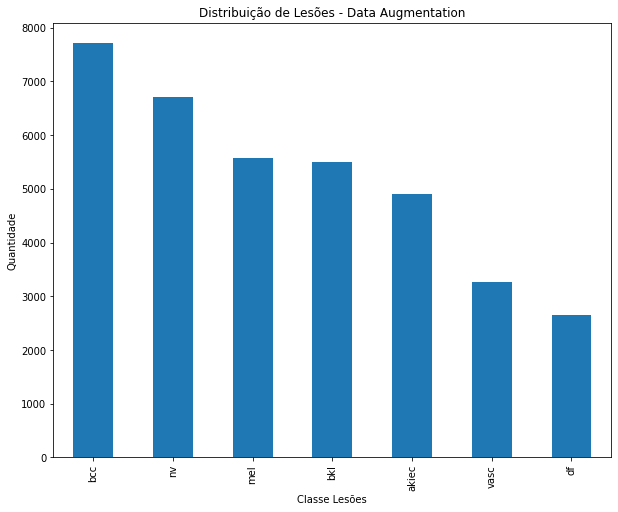

In [ ]:
df_meta.dx.value_counts().plot(kind='bar',
                               figsize=(10, 8), 
                               xlabel='Classe Lesões', 
                               ylabel='Quantidade',
                               title='Distribuição de Lesões - Data Augmentation');

#### Stratified K-Fold

In [ ]:
# create kfold column
df_meta['kfold'] = -1

In [ ]:
df_meta.head()

,dx,path,kfold
ISIC_0024306,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0024...,-1
ISIC_0024307,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0024...,-1
ISIC_0024308,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0024...,-1
ISIC_0024309,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0024...,-1
ISIC_0024310,mel,/content/drive/MyDrive/HAM10k/images/ISIC_0024...,-1


In [ ]:
df_meta.reset_index(drop=True)

,dx,path,kfold
0,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0024...,-1
1,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0024...,-1
2,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0024...,-1
3,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0024...,-1
4,mel,/content/drive/MyDrive/HAM10k/images/ISIC_0024...,-1
...,...,...,...
36286,bkl,/content/drive/MyDrive/HAM10k/images/ISIC_0034...,-1
36287,bkl,/content/drive/MyDrive/HAM10k/images/ISIC_0034...,-1
36288,bkl,/content/drive/MyDrive/HAM10k/images/ISIC_0034...,-1
36289,nv,/content/drive/MyDrive/HAM10k/images/ISIC_0034...,-1


In [ ]:
# create test_set
test_df = df_meta.sample(frac=0.2, random_state=42)

df = df_meta.drop(index=test_df.index)

In [ ]:
# randomize the rows
df = df.sample(frac=1., random_state=42).reset_index(drop=True)

# fetch targets
targets = df.dx

In [ ]:
len(df.dx.unique())

7

INPUT_SHAPE is (224, 224, 3)
234708992/234698864 [==============================] - 5s 0us/step
Creating fold 0
Creating fold 1
Creating fold 2
Creating fold 3
Creating fold 4


/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/dataframe_iterator.py:282: UserWarning: Found 1 invalid image filename(s) in x_col="path". These filename(s) will be ignored.
  .format(n_invalid, x_col)


Found 23225 validated image filenames belonging to 7 classes.
Found 5807 validated image filenames belonging to 7 classes.
Found 7258 validated image filenames belonging to 7 classes.
Start Training...
FOLD: 0
Epoch 1/10
725/725 [==============================] - 6047s 8s/step - loss: 1.0574 - accuracy: 0.5932 - val_loss: 0.7146 - val_accuracy: 0.7350
Epoch 2/10
725/725 [==============================] - 492s 679ms/step - loss: 0.7483 - accuracy: 0.7122 - val_loss: 0.6120 - val_accuracy: 0.7669
Epoch 3/10
725/725 [==============================] - 492s 679ms/step - loss: 0.6263 - accuracy: 0.7578 - val_loss: 0.5336 - val_accuracy: 0.7913
Epoch 4/10
725/725 [==============================] - 492s 679ms/step - loss: 0.5393 - accuracy: 0.7946 - val_loss: 0.5502 - val_accuracy: 0.7837
Epoch 5/10
725/725 [==============================] - 493s 679ms/step - loss: 0.4718 - accuracy: 0.8209 - val_loss: 0.4458 - val_accuracy: 0.8327
Epoch 6/10
725/725 [==============================] - 493s 679

No handles with labels found to put in legend.
No handles with labels found to put in legend.


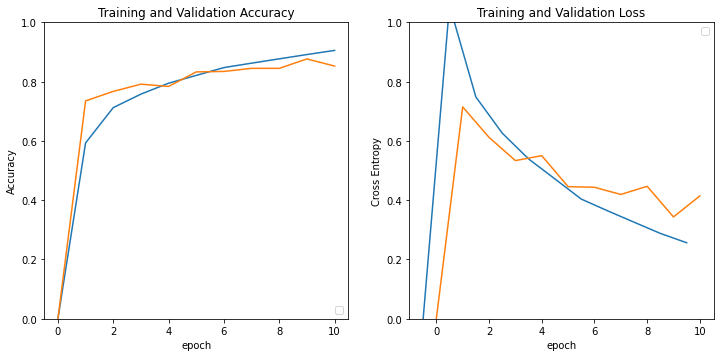

227/227 [==============================] - 125s 549ms/step - loss: 0.3972 - accuracy: 0.8556


ValueError: ignored

In [ ]:
BATCH_SIZE = 32
NN = 'resnet'
IMG_SIZE = hp.set_input_size(NN)
FOLDS = 5

# get number of classes
classes = df.dx.unique()

# Setup GPU Model
INPUT_SHAPE = hp.set_input_size(NN) + (3,)
print(f'INPUT_SHAPE is {INPUT_SHAPE}')

base_model = tf.keras.applications.ResNet152(input_shape=INPUT_SHAPE,
                                             include_top=False, 
                                             weights='imagenet')

# freeze the base model
base_model.trainable = False

inputs = tf.keras.Input(shape=INPUT_SHAPE)

head_model = base_model(inputs, training=False)
head_model = tfl.AveragePooling2D(pool_size=(7,7))(head_model)
head_model = tfl.Flatten(name="flatten")(head_model)
#head_model = tfl.Dense(512, activation='relu')(head_model)
head_model = tfl.Dense(256, activation='relu')(head_model)
#head_model = tfl.Dense(128, activation='relu')(head_model)
#head_model = tfl.Dense(64, activation='relu')(head_model)
head_model = tfl.Dense(32, activation='relu')(head_model)
head_model = tfl.Dropout(0.2)(head_model)
head_model = tfl.Dense(len(classes), activation='softmax')(head_model)

#create kfold object
from sklearn.model_selection import StratifiedKFold
kf = StratifiedKFold(n_splits=FOLDS, shuffle=True, random_state=42)

# fill the kfold column
for fold, (train, val) in enumerate(kf.split(X=df, y=targets)):
    print(f'Creating fold {fold}')
    df.loc[val, 'kfold'] = fold

# go over folds
for fold in range(FOLDS):
    # create temp dfs
    train_df = df[df.kfold != fold].reset_index(drop=True)
    val_df = df[df.kfold == fold].reset_index(drop=True)

    # create ImageDataGenerator
    img_gen = ImageDataGenerator(preprocessing_function=preprocess_input)
    # create the training dataset
    df_train = img_gen.flow_from_dataframe(train_df, 
                                            x_col="path", 
                                            y_col="dx",
                                            class_mode="categorical",
                                            target_size=IMG_SIZE,
                                            batch_size=BATCH_SIZE,                                                    
                                            color_mode="rgb",
                                            shuffle=True,
                                            seed=42)
    
    # create the validation dataset
    df_val = img_gen.flow_from_dataframe(val_df, 
                                        x_col="path", 
                                        y_col="dx",
                                        class_mode="categorical",
                                        target_size=IMG_SIZE,
                                        batch_size=BATCH_SIZE,                                                    
                                        color_mode="rgb",
                                        shuffle=True,
                                        seed=42)
    
    # create test dataset
    df_test = img_gen.flow_from_dataframe(test_df, 
                                        x_col="path", 
                                        y_col="dx",
                                        class_mode="categorical",
                                        target_size=IMG_SIZE,
                                        batch_size=BATCH_SIZE,                                                    
                                        color_mode="rgb",
                                        shuffle=True,
                                        seed=42)

    


    

    # create the transfer learning model with the head model
    # on top of the base model
    tl_model = tf.keras.Model(inputs=inputs, outputs=head_model)

    base_learning_rate = 0.001

    # define early_stopping callback
    early_stopping = tf.keras.callbacks.EarlyStopping(patience=10, 
                                                    restore_best_weights=True)

    # define model checkpoint
    model_check_point = tf.keras.callbacks.ModelCheckpoint(filepath= './',
                                                        monitor='val_loss', 
                                                        verbose=1,
                                                        save_best_only=True,
                                                        save_weights_only=False,
                                                        mode='auto',
                                                        save_freq='epoch')

    # Define a BinaryCrossentropy loss function. Use from_logits=True
    loss_function= tf.keras.losses.CategoricalCrossentropy()
    # Define an Adam optimizer base_learning_rate
    optimizer = tf.keras.optimizers.Adam(base_learning_rate)
    # Use accuracy as evaluation metric
    metrics= ['accuracy']

    tl_model.compile(loss=loss_function,
                    optimizer = optimizer,
                    metrics=metrics)
    

    # start training
    STEP_SIZE_TRAIN = df_train.samples//df_train.batch_size
    STEP_SIZE_VALID = df_val.samples//df_val.batch_size

    print(f'Start Training...')
    print(f'FOLD: {fold}')

    history = tl_model.fit(df_train,
                            epochs=10,
                            steps_per_epoch=STEP_SIZE_TRAIN,
                            validation_steps=STEP_SIZE_VALID,
                            validation_data=df_val,
                            callbacks=[early_stopping])

    # plot learning curves
    hp.plot_learning_curves(history)
    plt.show()
       

    # predictions
    predictions = tl_model.predict(df_test)
    predicted = [np.argmax(w) for w in predictions]
    expected = df_test.labels

    # Evaluation Results
    loss_value , accuracy = tl_model.evaluate(df_test)
    roc_auc = roc_auc_score(expected, predicted)

    print(f'Results for FOLD {fold}: \n')
    print(f'Test loss_value: {loss_value}')
    print(f'Test accuracy: {accuracy}')
    print(f'AUC: {roc_auc}')
    print(f'-------------------------------')


    # Classification Report
    print(f'Classes: {df_test.class_indices}\n')
    print(classification_report(expected, predicted))
    print(f'--------------------------------')

    # save model
    print(f'Saving {NN}_model_{fold} to disk.')
    try:
        tl_model.save(f'/content/drive/MyDrive/HAM10k/models/{NN}_model_{fold}_untuned.h5')
    except IOError as e:
        print(f'Failed to save to disk.\n Error: {e}')
    print(f'{NN}_model_{fold}_untuned.h5 successfully saved to disk.')



### Fine Tuning

In [ ]:
# load trained layers
tl_tune = tf.keras.models.load_model('/content/drive/MyDrive/HAM10k/models/model_0_untuned.h5')

In [ ]:
fine_tune_at = 420

for layer in tune_model.layers[:fine_tune_at]:
    layer.trainable = False

In [ ]:
base_learning_rate = 0.001
# define early_stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(patience=10, 
                                                  restore_best_weights=True)

# Define a CategoricalCrossentropy loss function. 
loss_function= tf.keras.losses.CategoricalCrossentropy()
# Define an Adam optimizer with a learning rate of 0.1 * base_learning_rate
optimizer = tf.keras.optimizers.Adam(0.1 * base_learning_rate)
# Use accuracy as evaluation metric
metrics= ['accuracy']

tl_tune.compile(loss=loss_function,
              optimizer = optimizer,
              metrics=metrics)

In [ ]:
history_fine = tune_model.fit(train_data,
                         epochs=100,
                         initial_epoch=history.epoch[-1],
                         validation_data=val_data,
                         callbacks=[early_stopping])

In [ ]:
hp.plot_learning_curves(history_fine)

### Dataset Balancing

In [ ]:
df_bal = hp.balance_dataset(df_meta)

2645


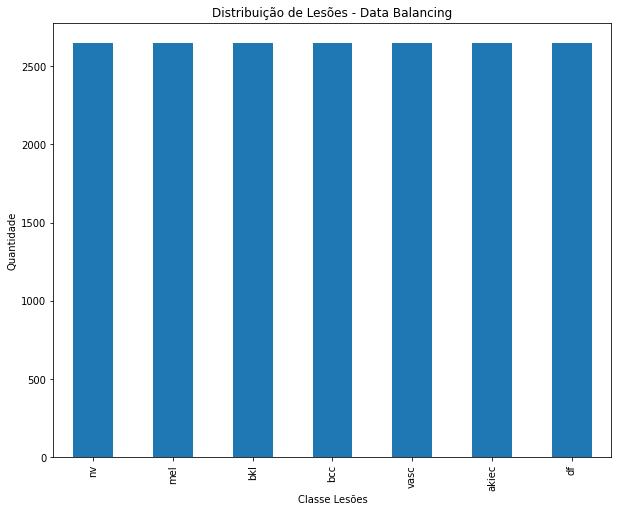

In [ ]:
df_bal.dx.value_counts().plot(kind='bar',
                               figsize=(10, 8), 
                               xlabel='Classe Lesões', 
                               ylabel='Quantidade',
                               title='Distribuição de Lesões - Data Balancing');

In [ ]:
df_bal.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18515 entries, ISIC_0026036 to ISIC_0034169_vertf
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   dx      18515 non-null  object
 1   path    18515 non-null  object
dtypes: object(2)
memory usage: 433.9+ KB


In [ ]:
train_bal_data, val_bal_data, test_bal_data = hp.create_training_validatation_sets(df_bal, 32, 'resnet', data_augmentation=True)

akiec    2264
bcc      2260
nv       2254
bkl      2238
vasc     2237
mel      2237
Name: dx, dtype: int64
mel      408
vasc     408
bkl      407
nv       391
bcc      385
akiec    381
Name: dx, dtype: int64
Found 10792 validated image filenames belonging to 6 classes.
Found 2698 validated image filenames belonging to 6 classes.
Found 2380 validated image filenames belonging to 6 classes.


Below, we can see what the first batch of training examples look like.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


['akiec' 'bcc' 'bkl' 'df' 'mel' 'nv' 'vasc']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

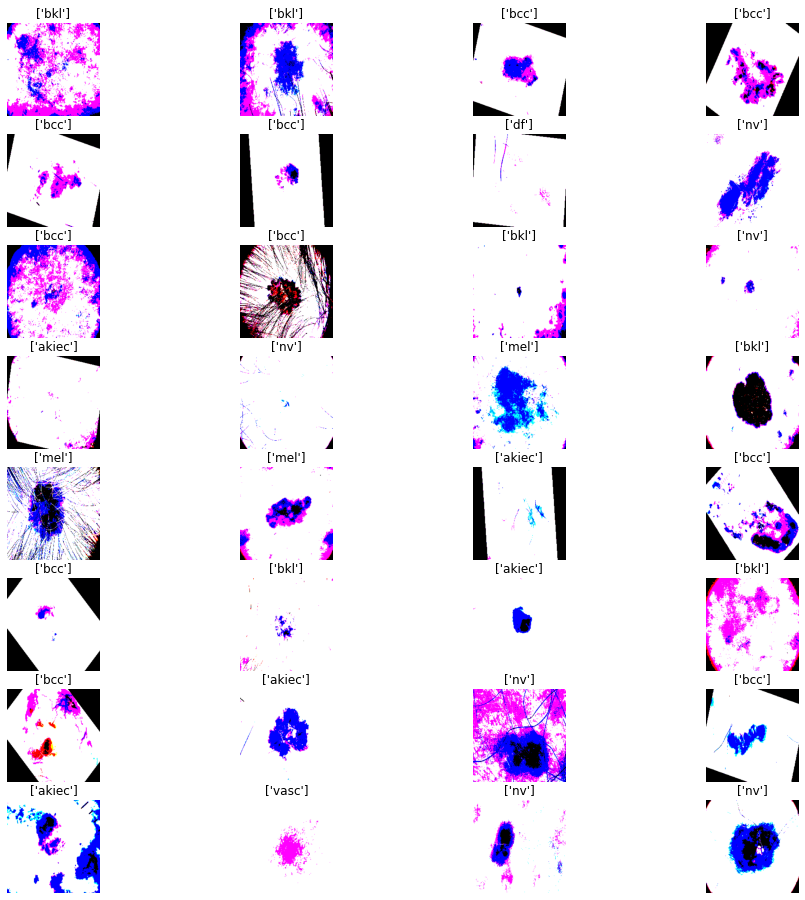

In [ ]:
first_batch_images, first_batch_labels = next(train_data)

plt.figure(figsize=(16, 16))

classes = np.array(list(train_data.class_indices.keys()))

print(classes)

for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(first_batch_images[i])
    lbl_mask = [not not x for x in first_batch_labels[i]] 
    plt.title(classes[lbl_mask])
    plt.axis("off")

## ALEXNET - Transfer Learning

AlexNet Model fit on the imbalanced dataset

In [ ]:
# load model
tune_alex = tf.keras.models.load_model('/content/drive/MyDrive/HAM10k/models/alexnet_tuned.h5')

In [ ]:
train_data, val_data, test_data = hp.create_training_validatation_sets(df_meta, 
                                                                       batch_size=32, 
                                                                       training_size=0.7,
                                                                       nn='alexnet', 
                                                                       data_augmentation=False)

bcc      5376
nv       4713
mel      3955
bkl      3873
akiec    3373
vasc     2265
df       1849
Name: dx, dtype: int64
bcc      1182
nv        975
bkl       828
mel       808
akiec     761
vasc      494
df        396
Name: dx, dtype: int64
bcc      1152
nv       1017
mel       802
bkl       794
akiec     771
vasc      507
df        400
Name: dx, dtype: int64
Found 25404 validated image filenames belonging to 7 classes.
Found 5444 validated image filenames belonging to 7 classes.
Found 5443 validated image filenames belonging to 7 classes.


['akiec' 'bcc' 'bkl' 'df' 'mel' 'nv' 'vasc']


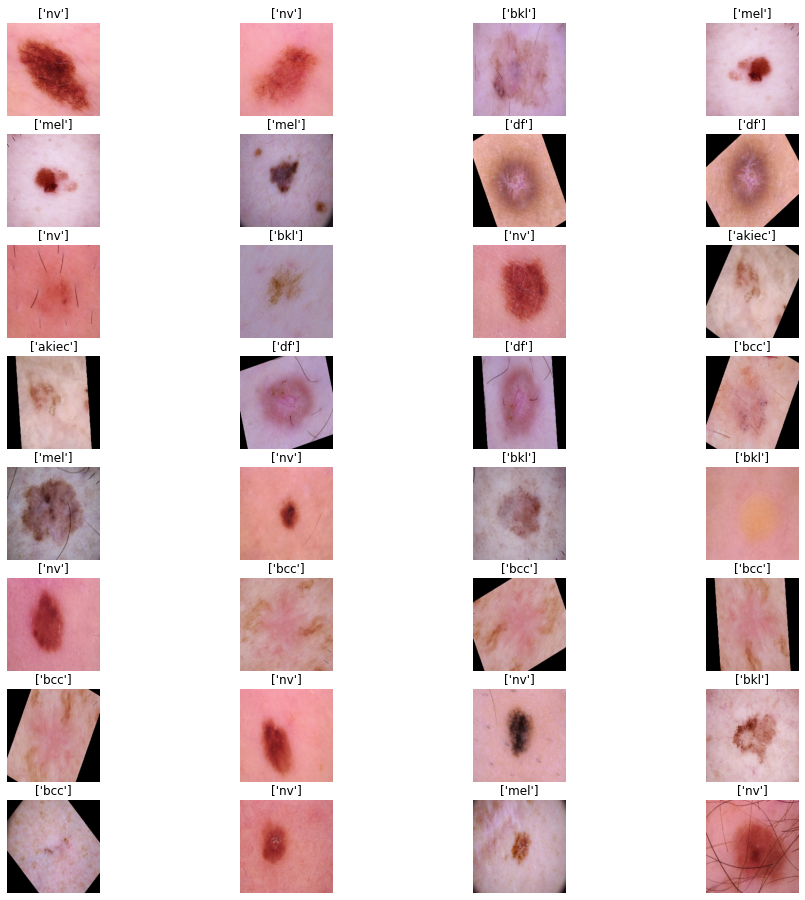

In [ ]:
hp.plot_samples(test_data)

In [ ]:
# predictions
predictions = tune_alex.predict(test_data)
predicted = [np.argmax(w) for w in predictions]
expected = test_data.labels

# Evaluation Results
loss_value , accuracy, auc = tune_alex.evaluate(test_data)

print(f'Test loss_value: {loss_value}')
print(f'Test accuracy: {accuracy}')
print(f'Test auc: {auc}')

171/171 [==============================] - 921s 5s/step - loss: 0.4318 - accuracy: 0.8466 - auc: 0.9822
Test loss_value: 0.43179184198379517
Test accuracy: 0.8465919494628906
Test auc: 0.9822400808334351


In [ ]:
# Classification Report
print(f'Classes: {test_data.class_indices}\n')
print(classification_report(expected, predicted))

Classes: {'akiec': 0, 'bcc': 1, 'bkl': 2, 'df': 3, 'mel': 4, 'nv': 5, 'vasc': 6}

              precision    recall  f1-score   support

           0       0.79      0.82      0.80       771
           1       0.87      0.84      0.85      1152
           2       0.78      0.81      0.80       794
           3       0.97      0.94      0.96       400
           4       0.80      0.79      0.79       802
           5       0.85      0.84      0.84      1017
           6       0.98      0.97      0.98       507

    accuracy                           0.85      5443
   macro avg       0.86      0.86      0.86      5443
weighted avg       0.85      0.85      0.85      5443



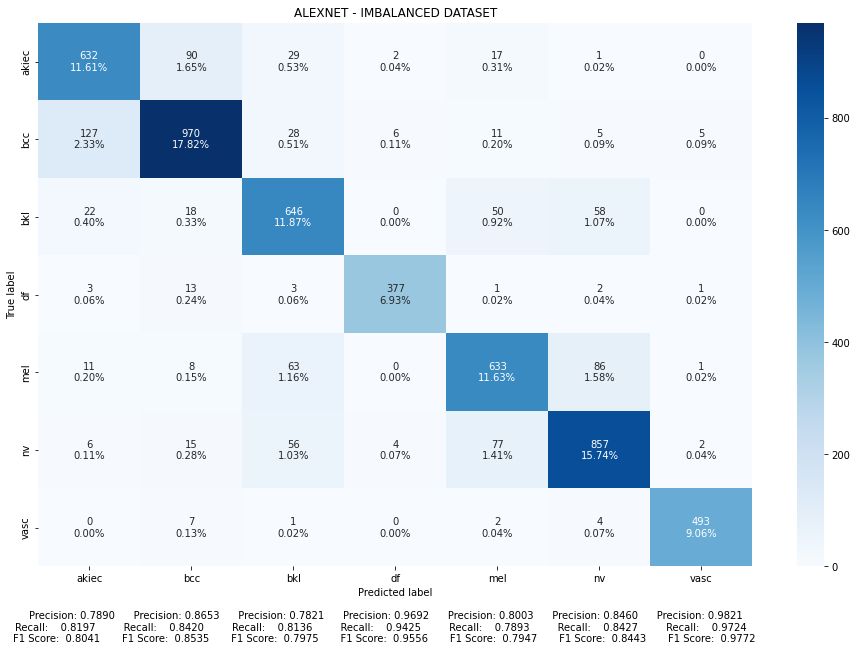

In [ ]:
# Confusion Matrix
categories = test_data.class_indices
cmatrix = confusion_matrix(expected, predicted)
hp.make_confusion_matrix(cmatrix, 
                         title='ALEXNET - IMBALANCED DATASET',
                         categories=categories,
                         xyplotlabels=True, 
                         figsize=(16, 10), 
                         cmap='Blues')

### ALEXNET - BALANCED DATASET

Test AlexNetModel fit on the imbalanced dataset in the balanced dataset

In [ ]:
df_bal = hp.balance_dataset(df_meta)

2645


In [ ]:
train_bal_data, val_bal_data, test_bal_data = hp.create_training_validatation_sets(df_bal, 
                                                                                   batch_size=32, 
                                                                                   training_size=0.7, 
                                                                                   nn='alexnet',
                                                                                   data_augmentation=False)

bcc      1897
bkl      1865
nv       1854
mel      1853
akiec    1852
vasc     1828
df       1811
Name: dx, dtype: int64
nv       417
vasc     414
akiec    402
mel      401
bkl      389
df       387
bcc      368
Name: dx, dtype: int64
df       447
vasc     403
mel      391
bkl      391
akiec    391
bcc      380
nv       374
Name: dx, dtype: int64
Found 12960 validated image filenames belonging to 7 classes.
Found 2778 validated image filenames belonging to 7 classes.
Found 2777 validated image filenames belonging to 7 classes.


['akiec' 'bcc' 'bkl' 'df' 'mel' 'nv' 'vasc']


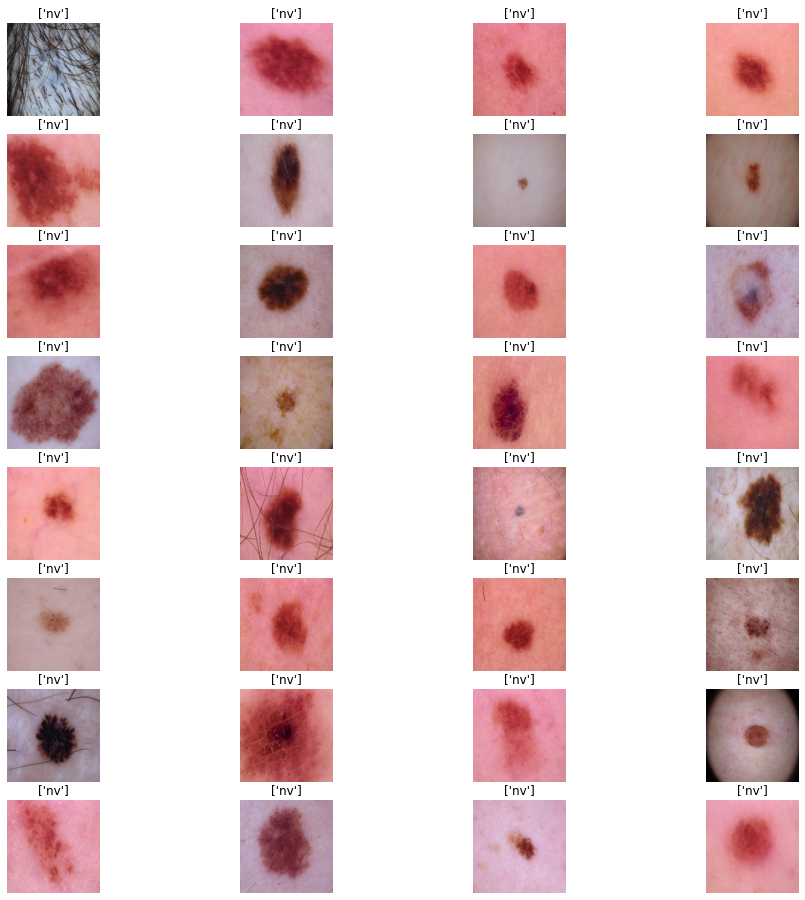

In [ ]:
hp.plot_samples(test_bal_data)

In [ ]:
# predictions
predictions = tune_alex.predict(test_bal_data)
predicted = [np.argmax(w) for w in predictions]
expected = test_bal_data.labels

# Evaluation Results
loss_value , accuracy, auc = tune_alex.evaluate(test_bal_data)

print(f'Test loss_value: {loss_value}')
print(f'Test accuracy: {accuracy}')
print(f'Test auc: {auc}')

87/87 [==============================] - 444s 5s/step - loss: 0.1907 - accuracy: 0.9420 - auc: 0.9957
Test loss_value: 0.1906833052635193
Test accuracy: 0.942023754119873
Test auc: 0.9956887364387512


In [ ]:
# Classification Report
print(f'Classes: {test_bal_data.class_indices}\n')
print(classification_report(expected, predicted))

Classes: {'akiec': 0, 'bcc': 1, 'bkl': 2, 'df': 3, 'mel': 4, 'nv': 5, 'vasc': 6}

              precision    recall  f1-score   support

           0       0.94      0.92      0.93       391
           1       0.90      0.95      0.93       380
           2       0.93      0.92      0.93       391
           3       1.00      0.98      0.99       447
           4       0.92      0.89      0.91       391
           5       0.89      0.94      0.91       374
           6       1.00      0.99      1.00       403

    accuracy                           0.94      2777
   macro avg       0.94      0.94      0.94      2777
weighted avg       0.94      0.94      0.94      2777



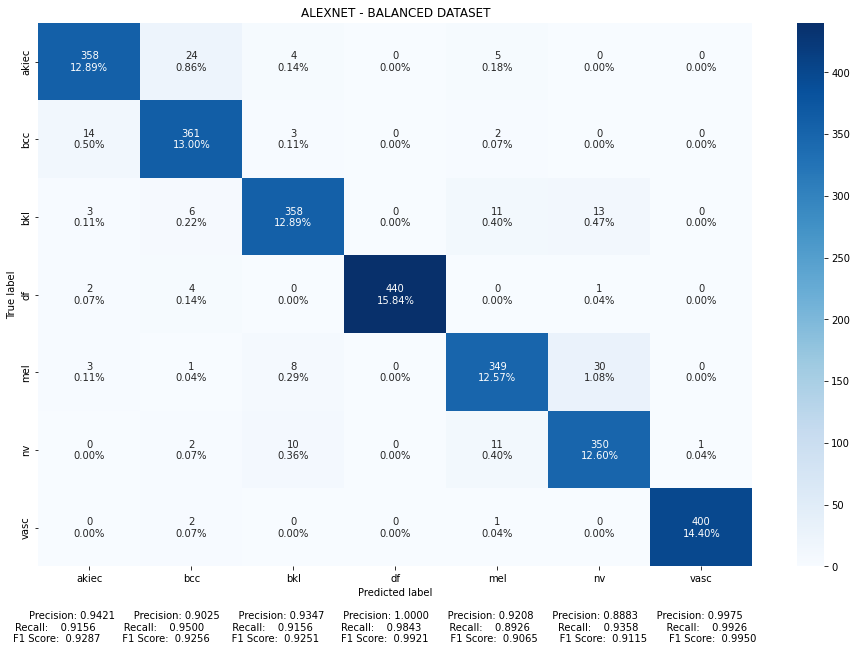

In [ ]:
categories = test_bal_data.class_indices
cmatrix = confusion_matrix(expected, predicted)
hp.make_confusion_matrix(cmatrix, 
                         title='ALEXNET - BALANCED DATASET',
                         categories=categories,
                         xyplotlabels=True, 
                         figsize=(16, 10), 
                         cmap='Blues')

## ResNet152 - Transfer Learning


In [6]:
INPUT_SHAPE = hp.set_input_size('resnet') + (3,)
print(INPUT_SHAPE)

(224, 224, 3)


In [7]:
base_model = tf.keras.applications.ResNet152(input_shape=INPUT_SHAPE,
                                             include_top=False, 
                                             weights='imagenet')

234708992/234698864 [==============================] - 3s 0us/step


In [ ]:
base_model.summary()

In [8]:
# get classes
classes = df_meta.dx.unique()

# set model to be placed on top of the base model
inputs = tf.keras.Input(shape=INPUT_SHAPE)

head_model = base_model(inputs, training=False)
head_model = tfl.AveragePooling2D(pool_size=(7,7))(head_model)
head_model = tfl.Flatten(name="flatten")(head_model)
head_model = tfl.Dense(512, activation='relu')(head_model)
head_model = tfl.Dropout(0.2)(head_model)
head_model = tfl.Dense(64, activation='relu')(head_model)
head_model = tfl.Dropout(0.2)(head_model)
head_model = tfl.Dense(len(classes), activation='softmax')(head_model)

In [9]:
# lock up the layers so not to be trained
base_model.trainable = False

# 
resnet = tf.keras.Model(inputs=inputs, outputs=head_model)

print(resnet.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 resnet152 (Functional)      (None, 7, 7, 2048)        58370944  
                                                                 
 average_pooling2d (AverageP  (None, 1, 1, 2048)       0         
 ooling2D)                                                       
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 512)               1049088   
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                             

In [10]:
base_learning_rate = 0.001

# define early_stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, 
                                                  restore_best_weights=True)

# define model checkpoint
model_check_point = tf.keras.callbacks.ModelCheckpoint(filepath= './',
                                                      monitor='val_loss', 
                                                      verbose=1,
                                                      save_best_only=True,
                                                      save_weights_only=False,
                                                      mode='auto',
                                                      save_freq='epoch')

# Define a BinaryCrossentropy loss function. Use from_logits=True
loss_function= tf.keras.losses.CategoricalCrossentropy()
# Define an Adam optimizer with a learning rate of 0.01 * base_learning_rate
optimizer = tf.keras.optimizers.Adam(base_learning_rate)
# Use accuracy as evaluation metric
metrics= ['accuracy', 'AUC']

resnet.compile(loss=loss_function,
                 optimizer = optimizer,
                 metrics=metrics)

In [11]:
# create imbalanced dataset
train_data, val_data, test_data = hp.create_training_validatation_sets(df_meta, 
                                                                       batch_size=32, 
                                                                       training_size=0.7,
                                                                       nn='resnet', 
                                                                       data_augmentation=False)

bcc      5376
nv       4713
mel      3955
bkl      3873
akiec    3373
vasc     2265
df       1849
Name: dx, dtype: int64
bcc      1182
nv        975
bkl       828
mel       808
akiec     761
vasc      494
df        396
Name: dx, dtype: int64
bcc      1152
nv       1017
mel       802
bkl       794
akiec     771
vasc      507
df        400
Name: dx, dtype: int64


/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/dataframe_iterator.py:282: UserWarning: Found 1 invalid image filename(s) in x_col="path". These filename(s) will be ignored.
  .format(n_invalid, x_col)


Found 25403 validated image filenames belonging to 7 classes.
Found 5444 validated image filenames belonging to 7 classes.
Found 5443 validated image filenames belonging to 7 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

['akiec' 'bcc' 'bkl' 'df' 'mel' 'nv' 'vasc']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

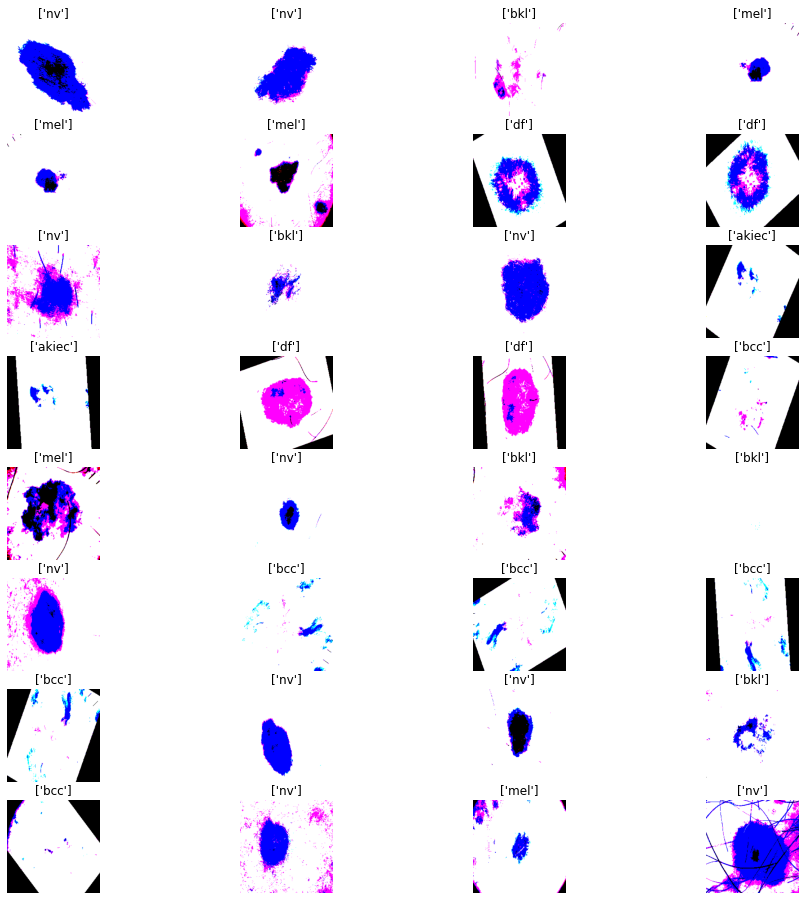

In [12]:
hp.plot_samples(test_data);

In [13]:
STEP_SIZE_TRAIN = train_data.samples//train_data.batch_size
STEP_SIZE_VALID = val_data.samples//val_data.batch_size

history = resnet.fit(train_data,
                    epochs=10,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_steps=STEP_SIZE_VALID,
                    validation_data=val_data,
                    callbacks=[early_stopping])

Epoch 1/10
793/793 [==============================] - 5611s 7s/step - loss: 1.0111 - accuracy: 0.6088 - auc: 0.9142 - val_loss: 0.7164 - val_accuracy: 0.7213 - val_auc: 0.9562
Epoch 2/10
793/793 [==============================] - 327s 412ms/step - loss: 0.7378 - accuracy: 0.7154 - auc: 0.9537 - val_loss: 0.5920 - val_accuracy: 0.7680 - val_auc: 0.9700
Epoch 3/10
793/793 [==============================] - 313s 395ms/step - loss: 0.6168 - accuracy: 0.7639 - auc: 0.9672 - val_loss: 0.5480 - val_accuracy: 0.7846 - val_auc: 0.9739
Epoch 4/10
793/793 [==============================] - 312s 393ms/step - loss: 0.5429 - accuracy: 0.7905 - auc: 0.9742 - val_loss: 0.4921 - val_accuracy: 0.8097 - val_auc: 0.9786
Epoch 5/10
793/793 [==============================] - 312s 393ms/step - loss: 0.4872 - accuracy: 0.8135 - auc: 0.9788 - val_loss: 0.4489 - val_accuracy: 0.8290 - val_auc: 0.9821
Epoch 6/10
793/793 [==============================] - 312s 394ms/step - loss: 0.4344 - accuracy: 0.8350 - auc: 0

No handles with labels found to put in legend.
No handles with labels found to put in legend.


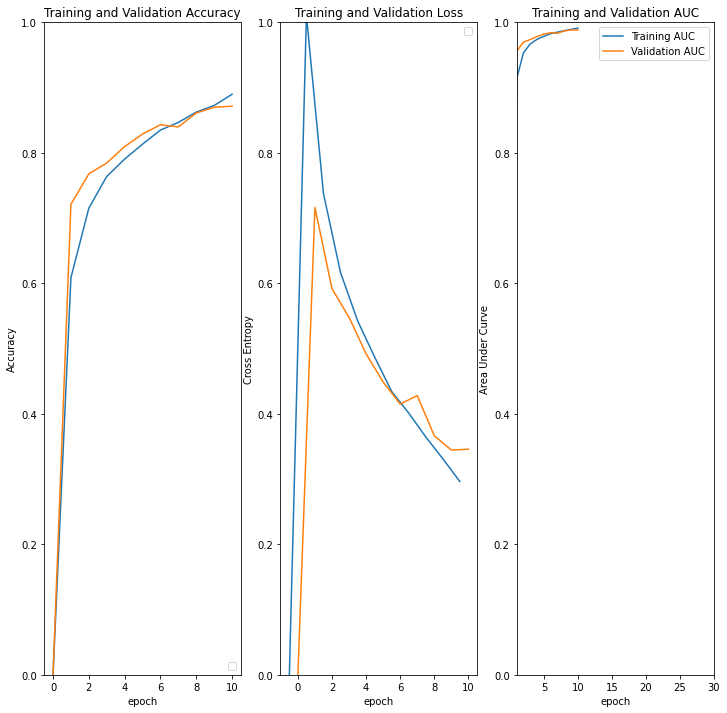

In [14]:
hp.plot_learning_curves(history)


In [15]:
# predictions
predictions = resnet.predict(test_data)
predicted = [np.argmax(w) for w in predictions]
expected = test_data.labels

# Evaluation Results
loss_value , accuracy, auc = resnet.evaluate(test_data)

print(f'Test loss_value: {loss_value}')
print(f'Test accuracy: {accuracy}')
print(f'Test AUC: {auc}')

171/171 [==============================] - 52s 304ms/step - loss: 0.3410 - accuracy: 0.8716 - auc: 0.9887
Test loss_value: 0.3410119414329529
Test accuracy: 0.8715781569480896
Test AUC: 0.9886630177497864


In [16]:
# Classification Report
print(f'Classes: {test_data.class_indices}\n')
print(classification_report(expected, predicted))

Classes: {'akiec': 0, 'bcc': 1, 'bkl': 2, 'df': 3, 'mel': 4, 'nv': 5, 'vasc': 6}

              precision    recall  f1-score   support

           0       0.90      0.88      0.89       771
           1       0.90      0.91      0.90      1152
           2       0.87      0.78      0.82       794
           3       0.97      0.89      0.93       400
           4       0.77      0.83      0.80       802
           5       0.82      0.88      0.85      1017
           6       0.98      0.96      0.97       507

    accuracy                           0.87      5443
   macro avg       0.89      0.87      0.88      5443
weighted avg       0.87      0.87      0.87      5443



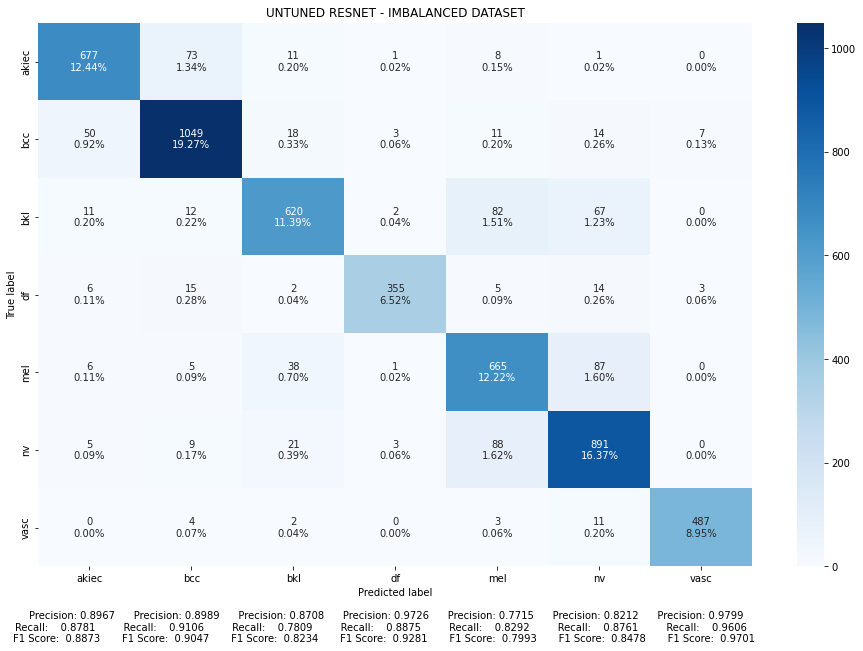

In [17]:
# Confusion Matrix
categories = test_data.class_indices
cmatrix = confusion_matrix(expected, predicted)
hp.make_confusion_matrix(cmatrix, 
                         title='UNTUNED RESNET - IMBALANCED DATASET',
                         categories=categories,
                         xyplotlabels=True, 
                         figsize=(16, 10), 
                         cmap='Blues')

#### Fine-Tuning

In [18]:
resnet_tuned = resnet

In [19]:
resnet_tuned.trainable = True

In [20]:
len(resnet_tuned.layers)

9

In [21]:
fine_tune_at = 5

for layer in resnet_tuned.layers[:fine_tune_at]:
    layer.trainable = False

In [22]:
# define early_stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, 
                                                  restore_best_weights=True)

# Define a CategoricalCrossentropy loss function. 
loss_function= tf.keras.losses.CategoricalCrossentropy()
# Define an Adam optimizer with a learning rate of 0.1 * base_learning_rate
optimizer = tf.keras.optimizers.Adam(0.1 * base_learning_rate)
# Use accuracy as evaluation metric
metrics= ['accuracy', 'AUC']

resnet_tuned.compile(loss=loss_function,
                    optimizer = optimizer,
                    metrics=metrics)

In [23]:
history_fine = resnet_tuned.fit(train_data,
                                epochs=50,
                                initial_epoch=history.epoch[-1],
                                validation_data=val_data,
                                callbacks=[early_stopping])

Epoch 10/50
794/794 [==============================] - 336s 413ms/step - loss: 0.2436 - accuracy: 0.9080 - auc: 0.9941 - val_loss: 0.3002 - val_accuracy: 0.8872 - val_auc: 0.9909
Epoch 11/50
794/794 [==============================] - 323s 407ms/step - loss: 0.2232 - accuracy: 0.9159 - auc: 0.9951 - val_loss: 0.2901 - val_accuracy: 0.8891 - val_auc: 0.9913
Epoch 12/50
794/794 [==============================] - 315s 396ms/step - loss: 0.2114 - accuracy: 0.9212 - auc: 0.9955 - val_loss: 0.2855 - val_accuracy: 0.8935 - val_auc: 0.9914
Epoch 13/50
794/794 [==============================] - 314s 395ms/step - loss: 0.2039 - accuracy: 0.9232 - auc: 0.9958 - val_loss: 0.2819 - val_accuracy: 0.8949 - val_auc: 0.9915
Epoch 14/50
794/794 [==============================] - 315s 396ms/step - loss: 0.1994 - accuracy: 0.9261 - auc: 0.9960 - val_loss: 0.2794 - val_accuracy: 0.8960 - val_auc: 0.9917
Epoch 15/50
794/794 [==============================] - 317s 398ms/step - loss: 0.1994 - accuracy: 0.9251 

No handles with labels found to put in legend.
No handles with labels found to put in legend.


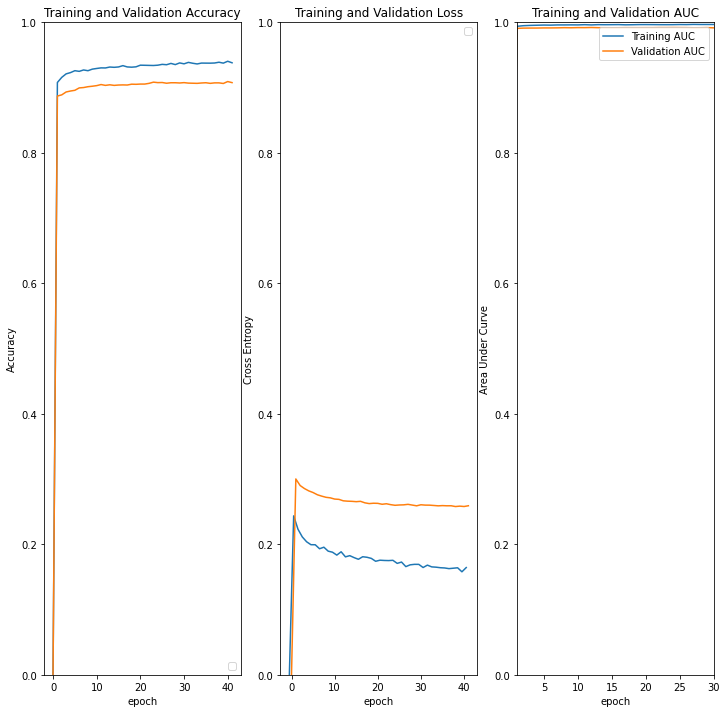

In [24]:
hp.plot_learning_curves(history_fine)

In [25]:
# predictions
predictions = resnet_tuned.predict(test_data)
predicted = [np.argmax(w) for w in predictions]
expected = test_data.labels

# Evaluation Results
loss_value , accuracy, auc = resnet_tuned.evaluate(test_data)

print(f'Test loss_value: {loss_value}')
print(f'Test accuracy: {accuracy}')
print(f'Test AUC: {auc}')

171/171 [==============================] - 53s 311ms/step - loss: 0.2745 - accuracy: 0.9015 - auc: 0.9917
Test loss_value: 0.27454841136932373
Test accuracy: 0.9015249013900757
Test AUC: 0.9916829466819763


In [ ]:
# Classification Report
print(f'Classes: {test_data.class_indices}\n')
print(classification_report(expected, predicted))

In [ ]:
# Confusion Matrix
categories = test_data.class_indices
cmatrix = confusion_matrix(expected, predicted)
hp.make_confusion_matrix(cmatrix, 
                         title='RESNET - IMBALANCED DATASET',
                         categories=categories,
                         xyplotlabels=True, 
                         figsize=(16, 10), 
                         cmap='Blues')

#### Balanced Dataset

In [28]:
# create balanced dataset
train_bal_data, val_bal_data, test_bal_data = hp.create_training_validatation_sets(df_meta, 
                                                                                  batch_size=32, 
                                                                                  training_size=0.7,
                                                                                  nn='resnet', 
                                                                                  data_augmentation=False)

bcc      5376
nv       4713
mel      3955
bkl      3873
akiec    3373
vasc     2265
df       1849
Name: dx, dtype: int64
bcc      1182
nv        975
bkl       828
mel       808
akiec     761
vasc      494
df        396
Name: dx, dtype: int64
bcc      1152
nv       1017
mel       802
bkl       794
akiec     771
vasc      507
df        400
Name: dx, dtype: int64
Found 25404 validated image filenames belonging to 7 classes.
Found 5444 validated image filenames belonging to 7 classes.
Found 5443 validated image filenames belonging to 7 classes.


In [29]:
# predictions
predictions = resnet_tuned.predict(test_bal_data)
predicted = [np.argmax(w) for w in predictions]
expected = test_bal_data.labels

# Evaluation Results
loss_value , accuracy, auc = resnet_tuned.evaluate(test_bal_data)

print(f'Test loss_value: {loss_value}')
print(f'Test accuracy: {accuracy}')
print(f'Test AUC: {auc}')

171/171 [==============================] - 53s 308ms/step - loss: 0.2745 - accuracy: 0.9015 - auc: 0.9917
Test loss_value: 0.27454841136932373
Test accuracy: 0.9015249013900757
Test AUC: 0.9916829466819763


In [ ]:
# Classification Report
print(f'Classes: {test_bal_data.class_indices}\n')
print(classification_report(expected, predicted))

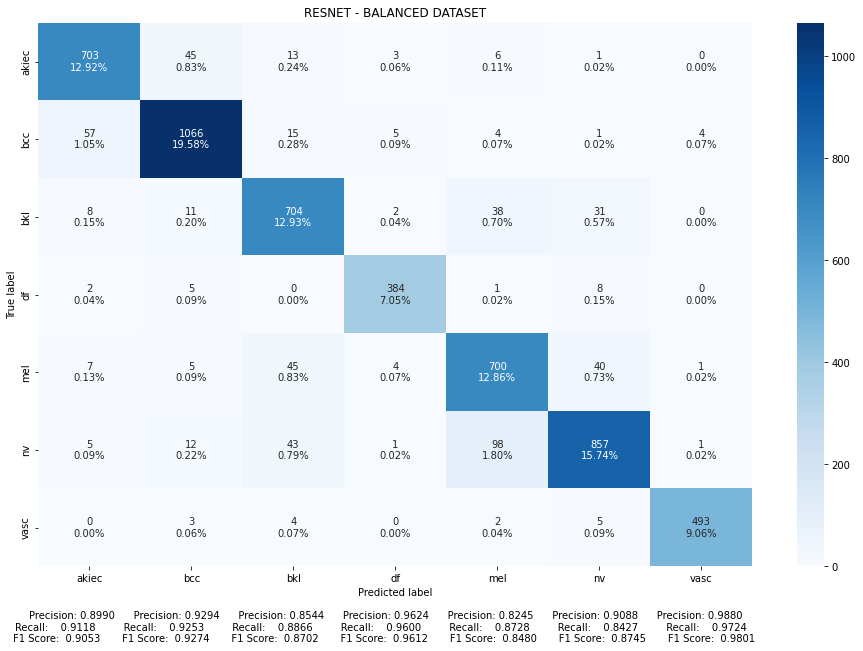

In [31]:
# Confusion Matrix
categories = test_bal_data.class_indices
cmatrix = confusion_matrix(expected, predicted)
hp.make_confusion_matrix(cmatrix, 
                         title='RESNET - BALANCED DATASET',
                         categories=categories,
                         xyplotlabels=True, 
                         figsize=(16, 10), 
                         cmap='Blues')

## Xception - Transfer Learning

In [ ]:
#del(train_data); del(val_data); del(test_data);
train_data, val_data, test_data = hp.create_training_validatation_sets(df_meta, 
                                                                       batch_size=32, 
                                                                       training_size=0.7,
                                                                       nn='xception', 
                                                                       data_augmentation=False)

bcc      5376
nv       4713
mel      3955
bkl      3873
akiec    3373
vasc     2265
df       1849
Name: dx, dtype: int64
bcc      1182
nv        975
bkl       828
mel       808
akiec     761
vasc      494
df        396
Name: dx, dtype: int64
bcc      1152
nv       1017
mel       802
bkl       794
akiec     771
vasc      507
df        400
Name: dx, dtype: int64


/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/dataframe_iterator.py:282: UserWarning: Found 1 invalid image filename(s) in x_col="path". These filename(s) will be ignored.
  .format(n_invalid, x_col)


Found 25403 validated image filenames belonging to 7 classes.
Found 5444 validated image filenames belonging to 7 classes.
Found 5443 validated image filenames belonging to 7 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

['akiec' 'bcc' 'bkl' 'df' 'mel' 'nv' 'vasc']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

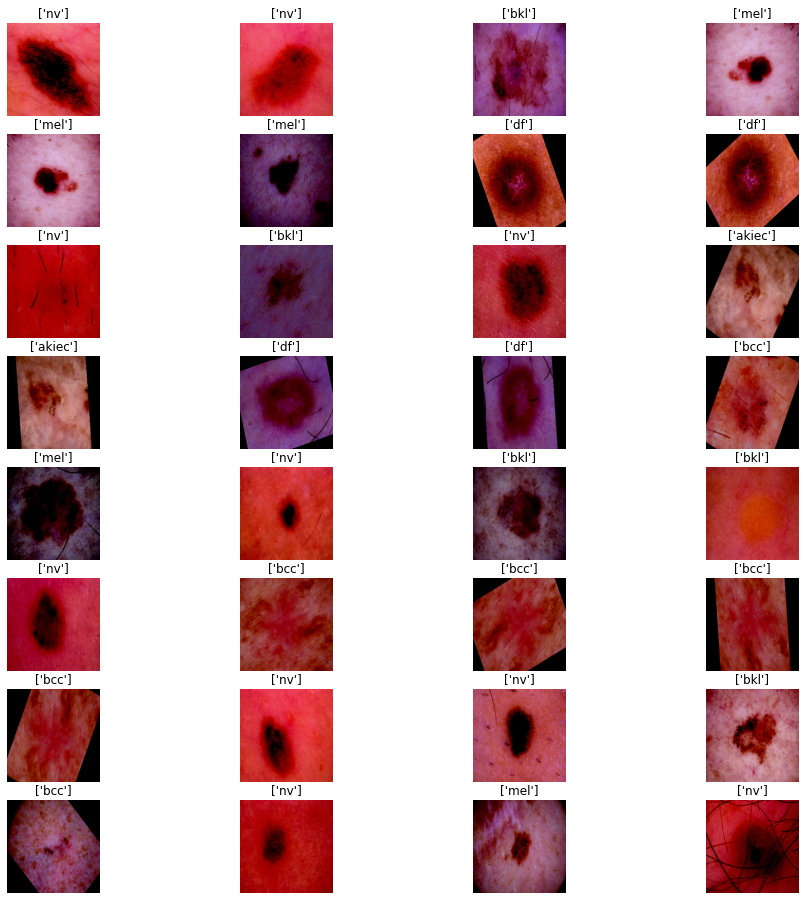

In [ ]:
hp.plot_samples(test_data)

In [ ]:
INPUT_SHAPE = hp.set_input_size('xception') + (3,)
print(INPUT_SHAPE)

(299, 299, 3)


In [ ]:
# get classes
classes = train_data.class_indices.keys()

# create the base_model
base_model = tf.keras.applications.Xception(
    weights='imagenet',
    input_shape=(INPUT_SHAPE),
    include_top=False
)

# Freeze the base_model
base_model.trainable = False

# create new model on top
inputs = tf.keras.Input(shape=INPUT_SHAPE)

# Pre-trained Xception weights requires that input be scaled
# from (0, 255) to a range of (-1., +1.), the rescaling layer
# outputs: `(inputs * scale) + offset`
scale_layer = tf.keras.layers.Rescaling(scale=1./127.5, offset=-1)
x = scale_layer(inputs)

# The base model contains batchnorm layers. We want to keep them in inference mode
# when we unfreeze the base model for fine-tuning, so we make sure that the
# base_model is running in inference mode here.
x = base_model(x, training=False)
x = tf.keras.layers.AveragePooling2D(pool_size=(10, 10))(x)
x = tfl.Flatten(name="flatten")(x)
x = tfl.Dense(512, activation='relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
#x = tfl.Dense(64, activation='relu')(x)
#x = tf.keras.layers.Dropout(0.2)(x)  # Regularize with dropout
outputs = tf.keras.layers.Dense(len(classes), activation='softmax')(x)
xception = tf.keras.Model(inputs, outputs)

xception.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 299, 299, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 299, 299, 3)       0         
                                                                 
 xception (Functional)       (None, 10, 10, 2048)      20861480  
                                                                 
 average_pooling2d_1 (Averag  (None, 1, 1, 2048)       0         
 ePooling2D)                                                     
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense_2 (Dense)             (None, 512)               1049088   
                                                           

In [ ]:
# define early_stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, 
                                                  restore_best_weights=True)

base_learning_rate = 0.0001

# Define a CategoricalCrossentropy loss function. Use from_logits=True
loss_function= tf.keras.losses.CategoricalCrossentropy()
# Define an Adam optimizer with a learning rate of 0.1 * base_learning_rate
optimizer = tf.keras.optimizers.Adam(base_learning_rate)
# Use accuracy as evaluation metric
metrics= ['accuracy', 'AUC']

xception.compile(loss=loss_function,
                 optimizer = optimizer,
                 metrics=metrics)

In [ ]:
STEP_SIZE_TRAIN = train_data.samples//train_data.batch_size
STEP_SIZE_VALID = val_data.samples//val_data.batch_size

history = xception.fit(train_data,
                       epochs=10,
                       steps_per_epoch=STEP_SIZE_TRAIN,
                       validation_steps=STEP_SIZE_VALID,
                       validation_data=val_data,
                       callbacks=[early_stopping])

Epoch 1/10
793/793 [==============================] - 7318s 9s/step - loss: 1.5939 - accuracy: 0.3344 - auc: 0.7655 - val_loss: 1.5442 - val_accuracy: 0.3585 - val_auc: 0.7891
Epoch 2/10
793/793 [==============================] - 331s 417ms/step - loss: 1.5148 - accuracy: 0.3780 - auc: 0.7941 - val_loss: 1.4929 - val_accuracy: 0.3818 - val_auc: 0.8048
Epoch 3/10
793/793 [==============================] - 315s 397ms/step - loss: 1.4692 - accuracy: 0.4022 - auc: 0.8104 - val_loss: 1.4568 - val_accuracy: 0.4263 - val_auc: 0.8194
Epoch 4/10
793/793 [==============================] - 311s 392ms/step - loss: 1.4325 - accuracy: 0.4195 - auc: 0.8216 - val_loss: 1.4209 - val_accuracy: 0.4123 - val_auc: 0.8284
Epoch 5/10
793/793 [==============================] - 319s 402ms/step - loss: 1.4038 - accuracy: 0.4266 - auc: 0.8296 - val_loss: 1.4014 - val_accuracy: 0.4094 - val_auc: 0.8296
Epoch 6/10
793/793 [==============================] - 318s 401ms/step - loss: 1.3790 - accuracy: 0.4352 - auc: 0

In [ ]:
# predictions
predictions = xception.predict(test_data)
predicted = [np.argmax(w) for w in predictions]
expected = test_data.labels

# Evaluation Results
loss_value, accuracy, auc = xception.evaluate(test_data)

print(f'Test loss_value: {loss_value}')
print(f'Test accuracy: {accuracy}')
print(f'Test auc: {auc}')

171/171 [==============================] - 54s 315ms/step - loss: 1.3025 - accuracy: 0.4740 - auc: 0.8559
Test loss_value: 1.3024818897247314
Test accuracy: 0.47400331497192383
Test auc: 0.8558529615402222


In [ ]:
# Classification Report
print(f'Classes: {test_data.class_indices}\n')
print(classification_report(expected, predicted))

Classes: {'akiec': 0, 'bcc': 1, 'bkl': 2, 'df': 3, 'mel': 4, 'nv': 5, 'vasc': 6}

              precision    recall  f1-score   support

           0       0.49      0.30      0.37       771
           1       0.61      0.50      0.55      1152
           2       0.32      0.21      0.25       794
           3       0.64      0.04      0.07       400
           4       0.47      0.55      0.51       802
           5       0.42      0.83      0.56      1017
           6       0.57      0.62      0.59       507

    accuracy                           0.47      5443
   macro avg       0.50      0.43      0.41      5443
weighted avg       0.49      0.47      0.44      5443



In [ ]:
categories = test_data.class_indices
cmatrix = confusion_matrix(expected, predicted)
hp.make_confusion_matrix(cmatrix, 
                         title='XCEPTION - IMBALANCED DATASET',
                         categories=categories,
                         xyplotlabels=True, 
                         figsize=(16, 10), 
                         cmap='Blues')

NameError: ignored

## MobileNet - Transfer Learning

In [ ]:
#del(train_data); del(val_data); del(test_data);
train_data, val_data, test_data = hp.create_training_validatation_sets(df_meta, 
                                                                       batch_size=32, 
                                                                       training_size=0.7,
                                                                       nn='mobilenet', 
                                                                       data_augmentation=False)

bcc      5376
nv       4713
mel      3955
bkl      3873
akiec    3373
vasc     2265
df       1849
Name: dx, dtype: int64
bcc      1182
nv        975
bkl       828
mel       808
akiec     761
vasc      494
df        396
Name: dx, dtype: int64
bcc      1152
nv       1017
mel       802
bkl       794
akiec     771
vasc      507
df        400
Name: dx, dtype: int64


/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/dataframe_iterator.py:282: UserWarning: Found 1 invalid image filename(s) in x_col="path". These filename(s) will be ignored.
  .format(n_invalid, x_col)


Found 25403 validated image filenames belonging to 7 classes.
Found 5444 validated image filenames belonging to 7 classes.
Found 5443 validated image filenames belonging to 7 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

['akiec' 'bcc' 'bkl' 'df' 'mel' 'nv' 'vasc']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

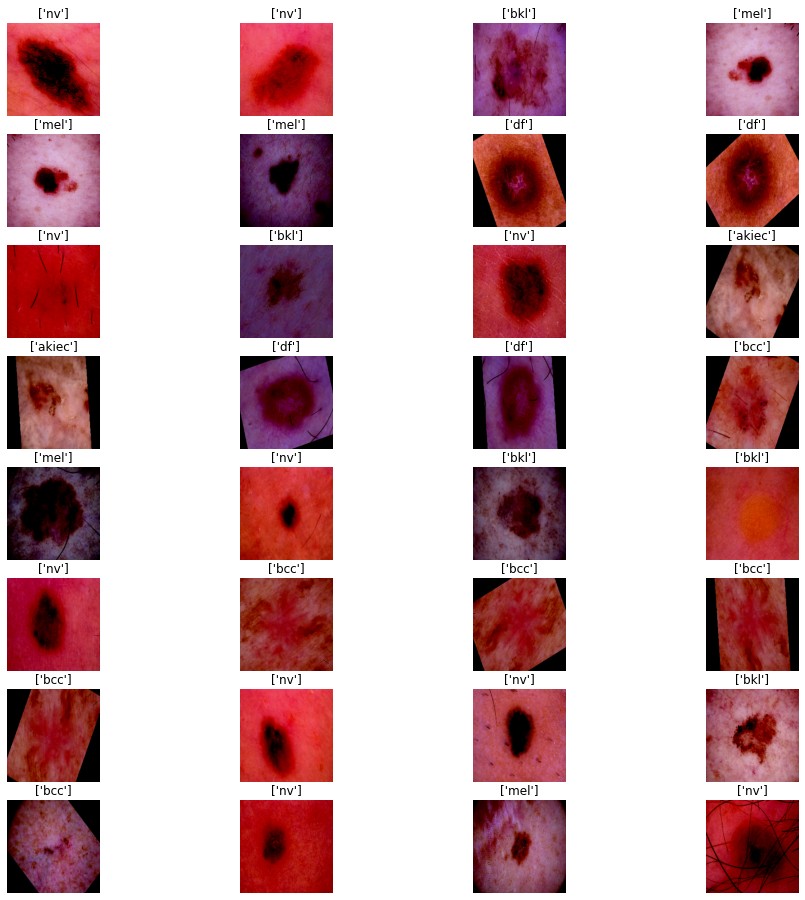

In [ ]:
hp.plot_samples(test_data)

In [ ]:
INPUT_SHAPE = hp.set_input_size('mobilenet') + (3,)
print(INPUT_SHAPE)

(224, 224, 3)


In [ ]:
# get classes
classes = train_data.class_indices.keys()

# create the base_model
base_model = tf.keras.applications.MobileNet(
    weights='imagenet',
    input_shape=(INPUT_SHAPE),
    include_top=False
)

# Freeze the base_model
base_model.trainable = False

# create new model on top
inputs = tf.keras.Input(shape=INPUT_SHAPE)

# The base model contains batchnorm layers. We want to keep them in inference mode
# when we unfreeze the base model for fine-tuning, so we make sure that the
# base_model is running in inference mode here.
x = base_model(inputs, training=False)
x = tf.keras.layers.AveragePooling2D(pool_size=(7, 7))(x)
x = tfl.Flatten(name="flatten")(x)
x = tfl.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = tfl.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
#x = tfl.Dense(64, activation='relu')(x)
#x = tf.keras.layers.Dropout(0.2)(x)  # Regularize with dropout
outputs = tf.keras.layers.Dense(len(classes), activation='softmax')(x)
mobilenet = tf.keras.Model(inputs, outputs)

mobilenet.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 mobilenet_1.00_224 (Functio  (None, 7, 7, 1024)       3228864   
 nal)                                                            
                                                                 
 average_pooling2d_4 (Averag  (None, 1, 1, 1024)       0         
 ePooling2D)                                                     
                                                                 
 flatten (Flatten)           (None, 1024)              0         
                                                                 
 dense_7 (Dense)             (None, 1024)              1049600   
                                                                 
 dropout_4 (Dropout)         (None, 1024)              0   

In [ ]:
# define early_stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, 
                                                  restore_best_weights=True)

base_learning_rate = 0.0001

# Define a CategoricalCrossentropy loss function. Use from_logits=True
loss_function= tf.keras.losses.CategoricalCrossentropy()
# Define an Adam optimizer with a learning rate of 0.1 * base_learning_rate
optimizer = tf.keras.optimizers.Adam(base_learning_rate)
# Use accuracy as evaluation metric
metrics= ['accuracy', 'AUC']

mobilenet.compile(loss=loss_function,
                 optimizer = optimizer,
                 metrics=metrics)

In [ ]:
STEP_SIZE_TRAIN = train_data.samples//train_data.batch_size
STEP_SIZE_VALID = val_data.samples//val_data.batch_size

history = mobilenet.fit(train_data,
                       epochs=10,
                       steps_per_epoch=STEP_SIZE_TRAIN,
                       validation_steps=STEP_SIZE_VALID,
                       validation_data=val_data,
                       callbacks=[early_stopping])

Epoch 1/10
793/793 [==============================] - 6543s 8s/step - loss: 0.9137 - accuracy: 0.6432 - auc: 0.9301 - val_loss: 0.7048 - val_accuracy: 0.7312 - val_auc: 0.9585
Epoch 2/10
793/793 [==============================] - 312s 393ms/step - loss: 0.6357 - accuracy: 0.7542 - auc: 0.9661 - val_loss: 0.5595 - val_accuracy: 0.7816 - val_auc: 0.9734
Epoch 3/10
793/793 [==============================] - 293s 370ms/step - loss: 0.5055 - accuracy: 0.8057 - auc: 0.9785 - val_loss: 0.4848 - val_accuracy: 0.8103 - val_auc: 0.9800
Epoch 4/10
793/793 [==============================] - 291s 367ms/step - loss: 0.4118 - accuracy: 0.8449 - auc: 0.9857 - val_loss: 0.4258 - val_accuracy: 0.8379 - val_auc: 0.9841
Epoch 5/10
793/793 [==============================] - 291s 366ms/step - loss: 0.3306 - accuracy: 0.8769 - auc: 0.9907 - val_loss: 0.4084 - val_accuracy: 0.8458 - val_auc: 0.9843
Epoch 6/10
793/793 [==============================] - 296s 373ms/step - loss: 0.2730 - accuracy: 0.8990 - auc: 0

No handles with labels found to put in legend.
No handles with labels found to put in legend.


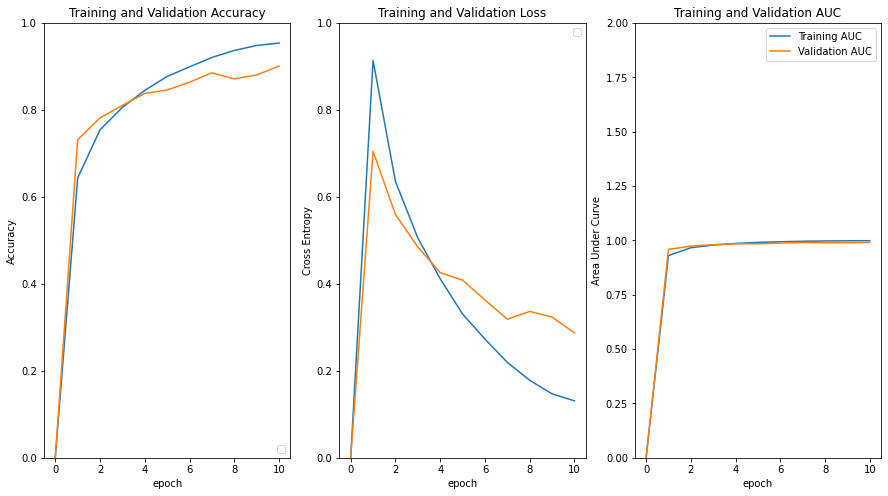

In [ ]:
epochs = np.arange(0, len(history.history['loss']) + 1)

acc = [0.] + history.history['accuracy']
val_acc = [0.] + history.history['val_accuracy']

loss = [0.] + history.history['loss']
val_loss = [0.] + history.history['val_loss']

auc = [0.] + history.history['auc']
val_auc = [0.] + history.history['val_auc']

plt.figure(figsize=(15, 8))
plt.subplot(1, 3, 1)
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([0,1])
plt.xlabel('epoch')
plt.title('Training and Validation Accuracy')
plt.plot(epochs, acc, label='Training Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')

# shift the training loss 0.5 epochs to the left 
plt.subplot(1, 3, 2)
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0, 1])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.plot(epochs, loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss')


# shift the training loss 0.5 epochs to the left 
plt.subplot(1, 3, 3)
plt.plot(epochs, auc, label='Training AUC')
plt.plot(epochs, val_auc, label='Validation AUC')
plt.legend(loc='upper right')
plt.ylabel('Area Under Curve')
plt.ylim([0, 2])
plt.title('Training and Validation AUC')
plt.xlabel('epoch')
plt.show()

In [ ]:
# predictions
predictions = mobilenet.predict(test_data)
predicted = [np.argmax(w) for w in predictions]
expected = test_data.labels

# Evaluation Results
loss_value, accuracy, auc = mobilenet.evaluate(test_data)

print(f'Test loss_value: {loss_value}')
print(f'Test accuracy: {accuracy}')
print(f'Test auc: {auc}')

171/171 [==============================] - 53s 309ms/step - loss: 0.2922 - accuracy: 0.8977 - auc: 0.9906
Test loss_value: 0.29224008321762085
Test accuracy: 0.8976667523384094
Test auc: 0.9905552268028259


In [ ]:
# Classification Report
print(f'Classes: {test_data.class_indices}\n')
print(classification_report(expected, predicted))

Classes: {'akiec': 0, 'bcc': 1, 'bkl': 2, 'df': 3, 'mel': 4, 'nv': 5, 'vasc': 6}

              precision    recall  f1-score   support

           0       0.93      0.83      0.88       771
           1       0.91      0.95      0.93      1152
           2       0.87      0.88      0.87       794
           3       0.96      0.94      0.95       400
           4       0.78      0.91      0.84       802
           5       0.92      0.83      0.87      1017
           6       0.98      0.99      0.99       507

    accuracy                           0.90      5443
   macro avg       0.91      0.90      0.90      5443
weighted avg       0.90      0.90      0.90      5443



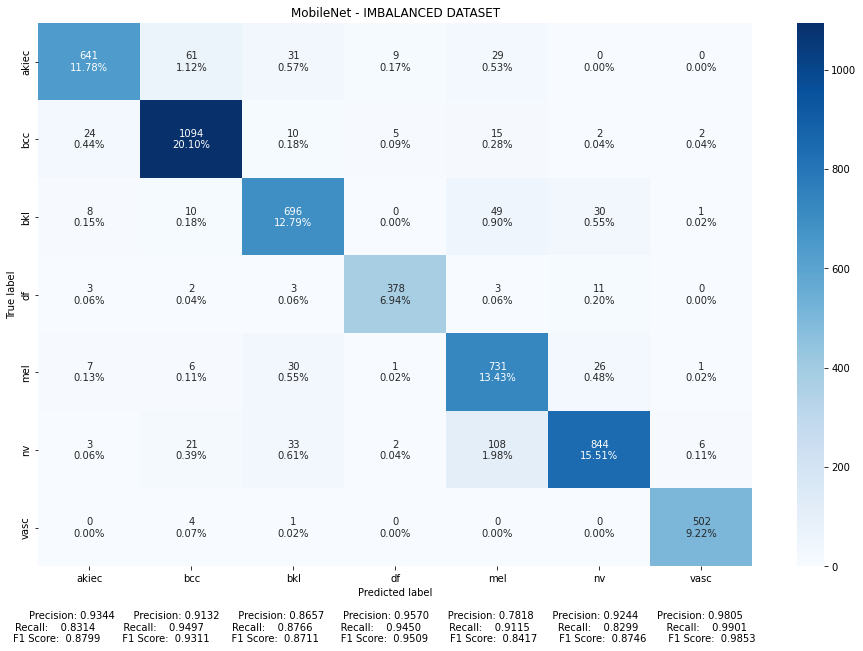

In [ ]:
categories = test_data.class_indices
cmatrix = confusion_matrix(expected, predicted)
hp.make_confusion_matrix(cmatrix, 
                         title='MobileNet - IMBALANCED DATASET',
                         categories=categories,
                         xyplotlabels=True, 
                         figsize=(16, 10), 
                         cmap='Blues')

In [ ]:
tf.keras.models.save_model(mobilenet, '/content/drive/MyDrive/HAM10k/models/mobilenet_untuned.h5')

#### Fine Tuning

In [ ]:
#tune_mobilenet = mobilenet
tune_mobilenet = tf.keras.models.load_model('/content/drive/MyDrive/HAM10k/models/mobilenet_untuned.h5')
print(f'Number of layers: {len(tune_mobilenet.layers)}')
tune_mobilenet.trainable = True

Number of layers: 9


In [ ]:
fine_tune_at = 7

for layer in tune_mobilenet.layers[:fine_tune_at]:
    layer.trainable = False

In [ ]:
base_learning_rate = 1e-3

# define early_stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, 
                                                  restore_best_weights=True)

# Define a CategoricalCrossentropy loss function. 
loss_function= tf.keras.losses.CategoricalCrossentropy()
# Define an Adam optimizer with a learning rate of 0.1 * base_learning_rate
optimizer = tf.keras.optimizers.Adam(0.5 * base_learning_rate)
# Set metrics
METRICS = [
     'accuracy', 'AUC'
]

tune_mobilenet.compile(loss=loss_function,
                      optimizer = optimizer,
                      metrics=METRICS)

In [ ]:
# get history from original model
history_fine = tune_mobilenet.fit(train_data,
                                 epochs=30,
                                 #initial_epoch=history.epoch[-1],
                                 validation_data=val_data,
                                 callbacks=[early_stopping])

Epoch 1/30
794/794 [==============================] - 7954s 10s/step - loss: 0.0774 - accuracy: 0.9752 - auc: 0.9996 - val_loss: 0.2698 - val_accuracy: 0.9082 - val_auc: 0.9914
Epoch 2/30
794/794 [==============================] - 282s 355ms/step - loss: 0.0675 - accuracy: 0.9770 - auc: 0.9996 - val_loss: 0.2795 - val_accuracy: 0.9115 - val_auc: 0.9906
Epoch 3/30
794/794 [==============================] - 262s 330ms/step - loss: 0.0623 - accuracy: 0.9787 - auc: 0.9996 - val_loss: 0.2770 - val_accuracy: 0.9105 - val_auc: 0.9911
Epoch 4/30
794/794 [==============================] - 259s 326ms/step - loss: 0.0623 - accuracy: 0.9780 - auc: 0.9996 - val_loss: 0.2820 - val_accuracy: 0.9122 - val_auc: 0.9901
Epoch 5/30
794/794 [==============================] - 258s 325ms/step - loss: 0.0573 - accuracy: 0.9802 - auc: 0.9996 - val_loss: 0.2850 - val_accuracy: 0.9060 - val_auc: 0.9901
Epoch 6/30
794/794 [==============================] - 260s 327ms/step - loss: 0.0552 - accuracy: 0.9804 - auc: 

No handles with labels found to put in legend.
No handles with labels found to put in legend.


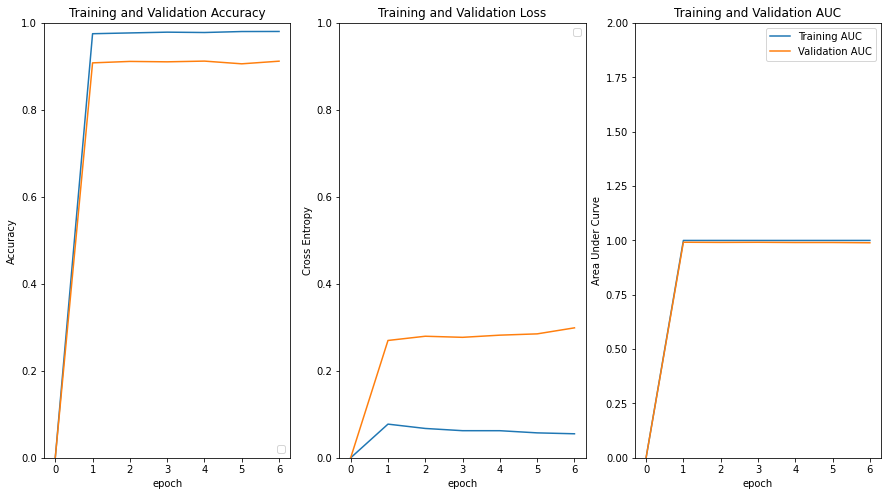

In [ ]:
epochs = np.arange(0, len(history_fine.history['loss']) + 1)

acc = [0.] + history_fine.history['accuracy']
val_acc = [0.] + history_fine.history['val_accuracy']

loss = [0.] + history_fine.history['loss']
val_loss = [0.] + history_fine.history['val_loss']

auc = [0.] + history_fine.history['auc']
val_auc = [0.] + history_fine.history['val_auc']

plt.figure(figsize=(15, 8))
plt.subplot(1, 3, 1)
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([0,1])
plt.xlabel('epoch')
plt.title('Training and Validation Accuracy')
plt.plot(epochs, acc, label='Training Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')

# shift the training loss 0.5 epochs to the left 
plt.subplot(1, 3, 2)
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0, 1])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.plot(epochs, loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss')


# shift the training loss 0.5 epochs to the left 
plt.subplot(1, 3, 3)
plt.plot(epochs, auc, label='Training AUC')
plt.plot(epochs, val_auc, label='Validation AUC')
plt.legend(loc='upper right')
plt.ylabel('Area Under Curve')
plt.ylim([0, 2])
plt.title('Training and Validation AUC')
plt.xlabel('epoch')
plt.show()

In [ ]:
# predictions
predictions = tune_mobilenet.predict(test_data)
predicted = [np.argmax(w) for w in predictions]
expected = test_data.labels

# Evaluation Results
loss_value, accuracy, auc = tune_mobilenet.evaluate(test_data)

print(f'Test loss_value: {loss_value}')
print(f'Test accuracy: {accuracy}')
print(f'Test auc: {auc}')

171/171 [==============================] - 43s 252ms/step - loss: 0.2744 - accuracy: 0.9089 - auc: 0.9910
Test loss_value: 0.27435943484306335
Test accuracy: 0.9088737964630127
Test auc: 0.9910205602645874


In [ ]:
# Classification Report
print(f'Classes: {test_data.class_indices}\n')
print(classification_report(expected, predicted))

Classes: {'akiec': 0, 'bcc': 1, 'bkl': 2, 'df': 3, 'mel': 4, 'nv': 5, 'vasc': 6}

              precision    recall  f1-score   support

           0       0.92      0.88      0.90       771
           1       0.92      0.96      0.94      1152
           2       0.89      0.86      0.87       794
           3       0.96      0.95      0.96       400
           4       0.84      0.88      0.86       802
           5       0.90      0.88      0.89      1017
           6       0.99      0.99      0.99       507

    accuracy                           0.91      5443
   macro avg       0.92      0.91      0.92      5443
weighted avg       0.91      0.91      0.91      5443



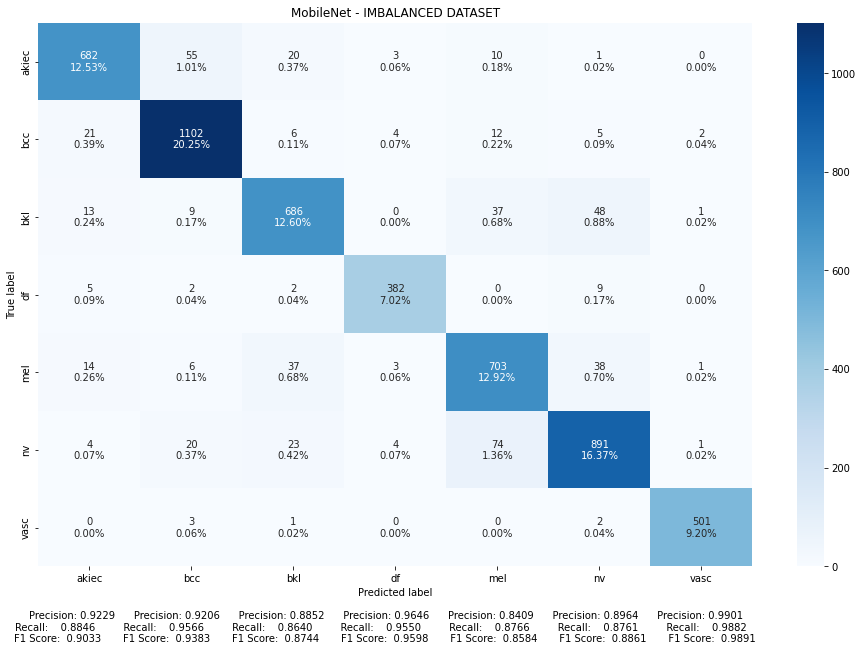

In [ ]:
categories = test_data.class_indices
cmatrix = confusion_matrix(expected, predicted)
hp.make_confusion_matrix(cmatrix, 
                         title='MobileNet - IMBALANCED DATASET',
                         categories=categories,
                         xyplotlabels=True, 
                         figsize=(16, 10), 
                         cmap='Blues')

In [ ]:
tf.keras.models.save_model(tune_mobilenet, '/content/drive/MyDrive/HAM10k/models/mobilenet_tuned.h5')

#### Balanced Dataset

In [ ]:
df_bal = hp.balance_dataset(df_meta)
# balanced dataset
train_bal_data, val_bal_data, test_bal_data = hp.create_training_validatation_sets(df_bal, 
                                                                       batch_size=32, 
                                                                       training_size=0.7,
                                                                       nn='mobilenet', 
                                                                       data_augmentation=False)

2645
bcc      1897
bkl      1865
nv       1854
mel      1853
akiec    1852
vasc     1828
df       1811
Name: dx, dtype: int64
nv       417
vasc     414
akiec    402
mel      401
bkl      389
df       387
bcc      368
Name: dx, dtype: int64
df       447
vasc     403
mel      391
bkl      391
akiec    391
bcc      380
nv       374
Name: dx, dtype: int64
Found 12960 validated image filenames belonging to 7 classes.
Found 2778 validated image filenames belonging to 7 classes.
Found 2777 validated image filenames belonging to 7 classes.


In [ ]:
# predictions
predictions = tune_mobilenet.predict(test_bal_data)
predicted = [np.argmax(w) for w in predictions]
expected = test_bal_data.labels

# Evaluation Results
loss_value, accuracy, auc = tune_mobilenet.evaluate(test_bal_data)

print(f'Test loss_value: {loss_value}')
print(f'Test accuracy: {accuracy}')
print(f'Test auc: {auc}')

87/87 [==============================] - 22s 249ms/step - loss: 0.1067 - accuracy: 0.9647 - auc: 0.9979
Test loss_value: 0.1067427396774292
Test accuracy: 0.9647101163864136
Test auc: 0.9978631138801575


In [ ]:
# Classification Report
print(f'Classes: {test_bal_data.class_indices}\n')
print(classification_report(expected, predicted))

Classes: {'akiec': 0, 'bcc': 1, 'bkl': 2, 'df': 3, 'mel': 4, 'nv': 5, 'vasc': 6}

              precision    recall  f1-score   support

           0       0.98      0.94      0.96       391
           1       0.95      0.99      0.97       380
           2       0.95      0.95      0.95       391
           3       1.00      0.98      0.99       447
           4       0.93      0.95      0.94       391
           5       0.94      0.94      0.94       374
           6       1.00      1.00      1.00       403

    accuracy                           0.96      2777
   macro avg       0.96      0.96      0.96      2777
weighted avg       0.97      0.96      0.96      2777



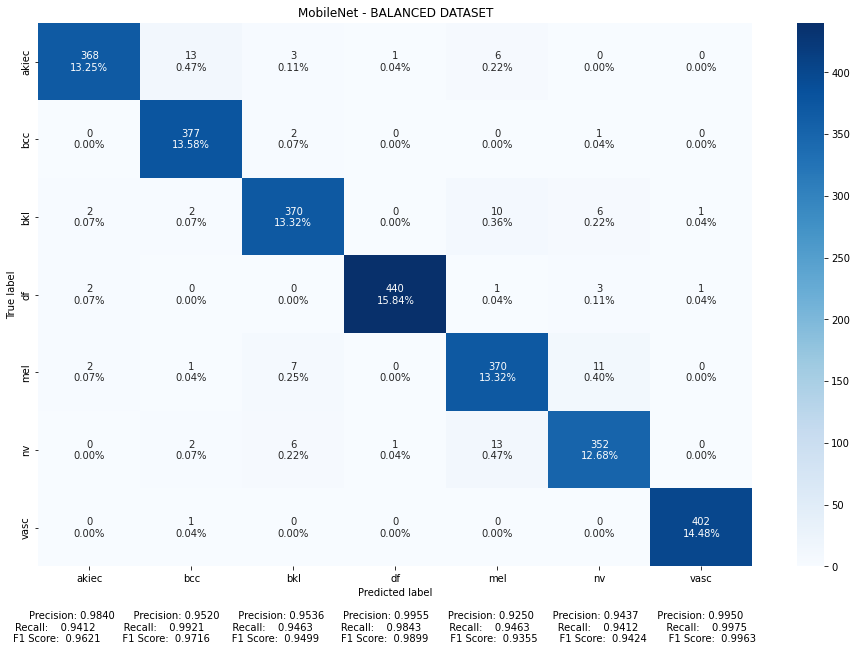

In [ ]:
categories = test_bal_data.class_indices
cmatrix = confusion_matrix(expected, predicted)
hp.make_confusion_matrix(cmatrix, 
                         title='MobileNet - BALANCED DATASET',
                         categories=categories,
                         xyplotlabels=True, 
                         figsize=(16, 10), 
                         cmap='Blues')